<h1><center>Hammaad 2237928</center></h1>
<center>DE CW NOTEBOOK</center>

<h2>Web Scraping data for Air pollution</h2>

Getting latitude and longitude of each city

In [10]:
import requests

def get_lat_lon(api_key,city_name,limit=1):
    BASE_URL = "http://api.openweathermap.org/geo/1.0/direct"
    url = f"{BASE_URL}?q={city_name}&limit={limit}&appid={api_key}"
    response = requests.get(url).json()
    lat=response[0]['lat']
    lon=response[0]['lon']
    return lat,lon

api_key = "a1cffafa176a92a84c228d49cef0a38b"
city_name = "Colombo"


response = get_lat_lon(api_key, city_name,limit=1)
print(response)


(6.9387469, 79.8541134)


Getting Air pollution Values with AQI 

In [28]:
import requests

def get_airPollution(api_key, lat, lon):
    BASE_URL = "http://api.openweathermap.org/data/2.5/air_pollution/history?"
    url = f"{BASE_URL}lat={lat}&lon={lon}&start=1546281000&end=1704047400&appid={api_key}"
    response = requests.get(url).json()
    return response

api_key = "a1cffafa176a92a84c228d49cef0a38b"
cities = ["Colombo","Matara","Nuwara Eliya","Monaragala","Kurunegala","Jaffna","Kandy"]

data=[]
for city_name in cities:
    lat,lon = get_lat_lon(api_key, city_name,limit=1)
    response = get_airPollution(api_key, lat, lon)    
    col=['Date-time','City','co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10','nh3','aqi']
    for i in response['list']:
        date=i['dt']
        current_date = datetime.utcfromtimestamp(date).strftime('%Y-%m-%d %H:%M:%S')
        i['dt']=current_date
        row=[i['dt'],city_name,i['components']['co'],i['components']['no'],i['components']['no2'],i['components']['o3'],i['components']['so2'],i['components']['pm2_5'],i['components']['pm10'],i['components']['nh3'],i['main']['aqi']]
        data.append(row)
        print(f"Scraped {city_name} data for {i['dt']}")
        
import pandas as pd
df=pd.DataFrame(data,columns=col)
df.to_csv('air_pollution.csv',index=False)


Scraped Colombo data for 2020-11-25 01:00:00
Scraped Colombo data for 2020-11-25 02:00:00
Scraped Colombo data for 2020-11-25 03:00:00
Scraped Colombo data for 2020-11-25 04:00:00
Scraped Colombo data for 2020-11-25 05:00:00
Scraped Colombo data for 2020-11-25 06:00:00
Scraped Colombo data for 2020-11-25 07:00:00
Scraped Colombo data for 2020-11-25 08:00:00
Scraped Colombo data for 2020-11-25 09:00:00
Scraped Colombo data for 2020-11-25 10:00:00
Scraped Colombo data for 2020-11-25 11:00:00
Scraped Colombo data for 2020-11-25 12:00:00
Scraped Colombo data for 2020-11-25 13:00:00
Scraped Colombo data for 2020-11-25 14:00:00
Scraped Colombo data for 2020-11-25 15:00:00
Scraped Colombo data for 2020-11-25 16:00:00
Scraped Colombo data for 2020-11-25 17:00:00
Scraped Colombo data for 2020-11-25 18:00:00
Scraped Colombo data for 2020-11-25 19:00:00
Scraped Colombo data for 2020-11-25 20:00:00
Scraped Colombo data for 2020-11-25 21:00:00
Scraped Colombo data for 2020-11-25 22:00:00
Scraped Co

Data only available from 2020 November onwards

<h2> Data Preprocessing </h2>

<h3>Data cleaning</h3>

Installing pyspark

In [139]:
! pip install pyspark


  Using cached pyspark-3.5.1-py2.py3-none-any.whl


In [1]:
import findspark
findspark.init()
from pyspark.sql import SparkSession

spark = SparkSession.builder.getOrCreate()

24/03/20 12:04:29 WARN Utils: Your hostname, Hammaads-MacBook-Air.local resolves to a loopback address: 127.0.0.1; using 192.168.1.140 instead (on interface en0)
24/03/20 12:04:29 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/03/20 12:04:30 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [8]:
data = spark.read.csv("uncleaned data/HCHO_data/col_mat_nuw_output.csv", header=True, inferSchema=True)
data.show()

+----------------------+--------------+----------+----------+
|0.00019698343957810148|Colombo Proper|2019-01-01|2019-01-02|
+----------------------+--------------+----------+----------+
|  2.625522171968594...|Colombo Proper|2019-01-02|2019-01-03|
|  9.852118897938794E-5|Colombo Proper|2019-01-03|2019-01-04|
|  2.099320518114242E-4|Colombo Proper|2019-01-04|2019-01-05|
|  1.785337298892930...|Colombo Proper|2019-01-05|2019-01-06|
|  1.082296700235670...|Colombo Proper|2019-01-06|2019-01-07|
|  3.926829280477309...|Colombo Proper|2019-01-07|2019-01-08|
|  9.153156350685351E-5|Colombo Proper|2019-01-08|2019-01-09|
|  1.205978992853015...|Colombo Proper|2019-01-09|2019-01-10|
|  1.297723562983258...|Colombo Proper|2019-01-10|2019-01-11|
|  2.239188166801278...|Colombo Proper|2019-01-11|2019-01-12|
|  1.569418094178759...|Colombo Proper|2019-01-12|2019-01-13|
|                  NULL|Colombo Proper|2019-01-13|2019-01-14|
|  1.336291906862603...|Colombo Proper|2019-01-14|2019-01-15|
|  6.374

In [13]:
data = spark.read.csv("uncleaned data/HCHO_data/col_mat_nuw_output.csv", header=False, inferSchema=True)
cols = ["HCHO Reading", "Location", "Current Date", "Next Date"]
data = data.toDF(*cols)
data.show()

+--------------------+--------------+------------+----------+
|        HCHO Reading|      Location|Current Date| Next Date|
+--------------------+--------------+------------+----------+
|1.969834395781014...|Colombo Proper|  2019-01-01|2019-01-02|
|2.625522171968594...|Colombo Proper|  2019-01-02|2019-01-03|
|9.852118897938794E-5|Colombo Proper|  2019-01-03|2019-01-04|
|2.099320518114242E-4|Colombo Proper|  2019-01-04|2019-01-05|
|1.785337298892930...|Colombo Proper|  2019-01-05|2019-01-06|
|1.082296700235670...|Colombo Proper|  2019-01-06|2019-01-07|
|3.926829280477309...|Colombo Proper|  2019-01-07|2019-01-08|
|9.153156350685351E-5|Colombo Proper|  2019-01-08|2019-01-09|
|1.205978992853015...|Colombo Proper|  2019-01-09|2019-01-10|
|1.297723562983258...|Colombo Proper|  2019-01-10|2019-01-11|
|2.239188166801278...|Colombo Proper|  2019-01-11|2019-01-12|
|1.569418094178759...|Colombo Proper|  2019-01-12|2019-01-13|
|                NULL|Colombo Proper|  2019-01-13|2019-01-14|
|1.33629

Added column headers

In [19]:
data.printSchema()

root
 |-- HCHO Reading: double (nullable = true)
 |-- Location: string (nullable = true)
 |-- Current Date: date (nullable = true)
 |-- Next Date: date (nullable = true)



Check for missing values (Nan or empty)

In [39]:
from pyspark.sql.functions import col

total=0
for col_name in data.columns:
    total=total+data.filter(col(col_name).isNull()).count()
    print(col_name, data.filter(col(col_name).isNull()).count())

print("\nMissing values Proportion",total/data.count()*100)


HCHO Reading 2419
Location 0
Current Date 0
Next Date 0

Missing values Proportion 44.15845198977729


Need to figure out the trend to decide if we need to drop or fill the missing values, and ifso its method

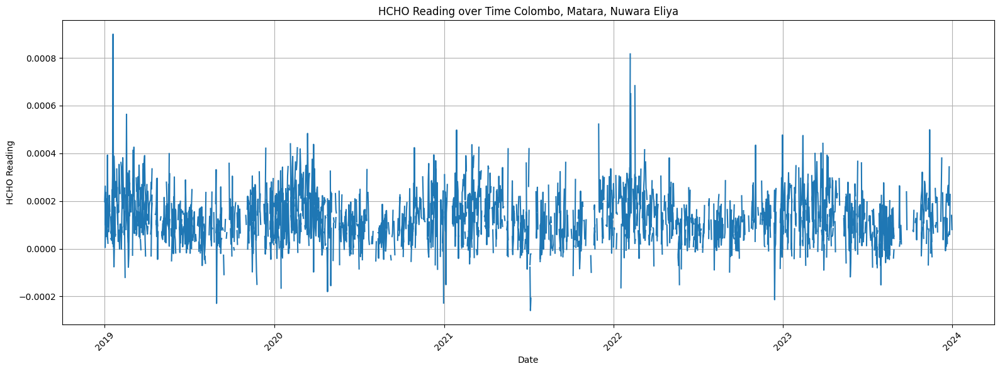

In [48]:
import matplotlib.pyplot as plt

plotting_data = data.select("Current Date", "HCHO Reading").toPandas()

plt.figure(figsize=(16, 6))
plt.plot(plotting_data["Current Date"], plotting_data["HCHO Reading"])
plt.title("HCHO Reading over Time Colombo, Matara, Nuwara Eliya")
plt.xlabel("Date")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()

plt.show()


In [46]:
null_dates = data.filter(col("HCHO Reading").isNull()).select("Current Date").distinct()

print("Dates with null HCHO readings:")
null_dates.count()


Dates with null HCHO readings:


1290

We can see that there are 1290 different days where the servers were unable to read the data

In [47]:
dates = data.select("Current Date").distinct()

print("Dates with null HCHO readings:")
dates.count()


Dates with null HCHO readings:


1826

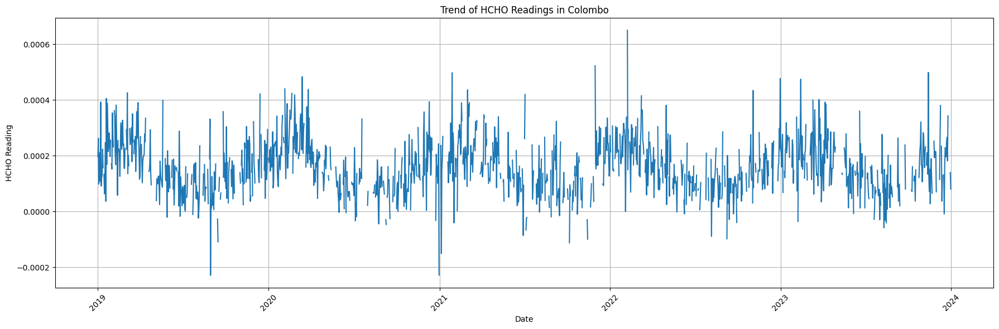

Missing values for Colombo:
+------------+--------------+------------+----------+
|HCHO Reading|      Location|Current Date| Next Date|
+------------+--------------+------------+----------+
|        NULL|Colombo Proper|  2019-01-13|2019-01-14|
|        NULL|Colombo Proper|  2019-01-29|2019-01-30|
|        NULL|Colombo Proper|  2019-02-04|2019-02-05|
|        NULL|Colombo Proper|  2019-02-14|2019-02-15|
|        NULL|Colombo Proper|  2019-03-01|2019-03-02|
|        NULL|Colombo Proper|  2019-03-02|2019-03-03|
|        NULL|Colombo Proper|  2019-03-09|2019-03-10|
|        NULL|Colombo Proper|  2019-03-18|2019-03-19|
|        NULL|Colombo Proper|  2019-03-21|2019-03-22|
|        NULL|Colombo Proper|  2019-04-03|2019-04-04|
|        NULL|Colombo Proper|  2019-04-14|2019-04-15|
|        NULL|Colombo Proper|  2019-04-15|2019-04-16|
|        NULL|Colombo Proper|  2019-04-16|2019-04-17|
|        NULL|Colombo Proper|  2019-04-17|2019-04-18|
|        NULL|Colombo Proper|  2019-04-19|2019-04-20|


In [69]:
colombo_data = data.filter(col("Location") == "Colombo Proper")

colombo_data_pandas = colombo_data.select("Current Date", "HCHO Reading").toPandas()

plt.figure(figsize=(18, 6))
plt.plot(colombo_data_pandas["Current Date"], colombo_data_pandas["HCHO Reading"])
plt.title("Trend of HCHO Readings in Colombo")
plt.xlabel("Date")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

missing_values_colombo = colombo_data.filter(col("HCHO Reading").isNull())
print("Missing values for Colombo:")
missing_values_colombo.show()

we can see in colombo there is a trend, usually in the middel of the year the HCHO readings are quite lower and it begains to rise durin the third quarter of the year,lets see the details for each year 

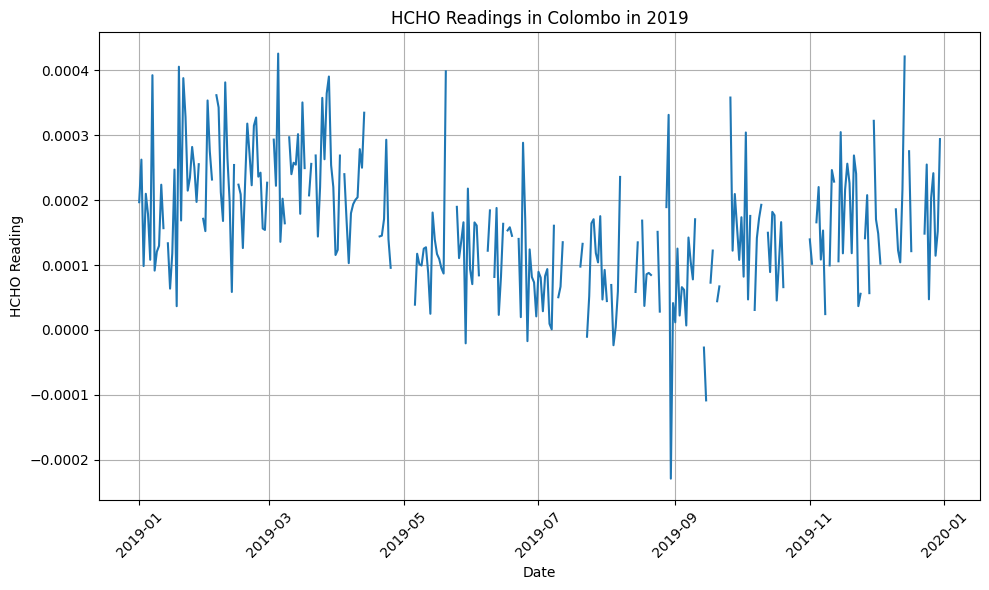

In [82]:
plt.figure(figsize=(10, 6))
plt.plot(colombo_2019_pandas["Current Date"], colombo_2019_pandas["HCHO Reading"])
plt.title("HCHO Readings in Colombo in 2019")
plt.xlabel("Date")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()



Fill the missing values based on each location

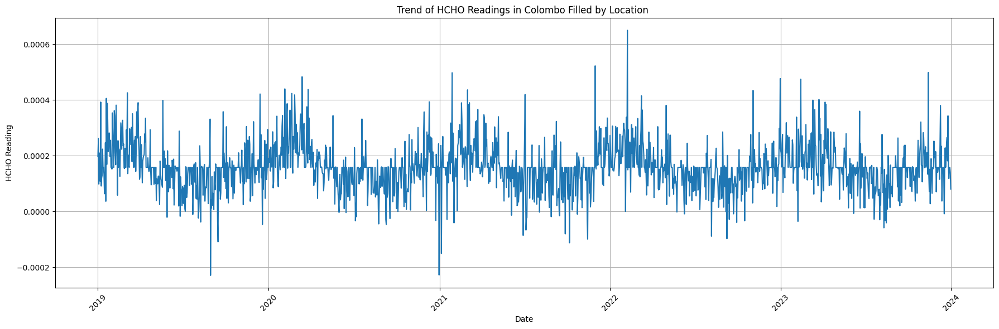

Missing values for Colombo:
+------------+--------+------------+---------+
|HCHO Reading|Location|Current Date|Next Date|
+------------+--------+------------+---------+
+------------+--------+------------+---------+



In [88]:
from pyspark.sql.functions import col, mean
colombo_data = data.filter(col("Location") == "Colombo Proper")

mean_hcho = colombo_data.select(mean("HCHO Reading")).collect()[0][0]
filled_data = colombo_data.fillna(mean_hcho, subset=["HCHO Reading"])

colombo_data_pandas = filled_data.select("Current Date", "HCHO Reading").toPandas()

plt.figure(figsize=(18, 6))
plt.plot(colombo_data_pandas["Current Date"], colombo_data_pandas["HCHO Reading"])
plt.title("Trend of HCHO Readings in Colombo Filled by Location ")
plt.xlabel("Date")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

missing_values_colombo = filled_data.filter(col("HCHO Reading").isNull())
print("Missing values for Colombo:")
missing_values_colombo.show()

When we fill the values as a location it is accurate next steps, therefore it countinues the original trend in the data.

In [1]:
import pyspark
import pyspark.sql as pyspark_sql
from pyspark import SparkConf

sc = pyspark.SparkContext.getOrCreate()
spark = pyspark_sql.SparkSession(sc)
data = spark.read.csv("uncleaned data/HCHO_data/col_mat_nuw_output.csv", header=False, inferSchema=True)
cols = ["HCHO Reading", "Location", "Current Date", "Next Date"]
data = data.toDF(*cols)
data.show()

24/03/08 15:08:35 WARN Utils: Your hostname, Hammaads-MacBook-Air.local resolves to a loopback address: 127.0.0.1; using 192.168.1.140 instead (on interface en0)
24/03/08 15:08:35 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/03/08 15:08:36 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


+--------------------+--------------+------------+----------+
|        HCHO Reading|      Location|Current Date| Next Date|
+--------------------+--------------+------------+----------+
|1.969834395781014...|Colombo Proper|  2019-01-01|2019-01-02|
|2.625522171968594...|Colombo Proper|  2019-01-02|2019-01-03|
|9.852118897938794E-5|Colombo Proper|  2019-01-03|2019-01-04|
|2.099320518114242E-4|Colombo Proper|  2019-01-04|2019-01-05|
|1.785337298892930...|Colombo Proper|  2019-01-05|2019-01-06|
|1.082296700235670...|Colombo Proper|  2019-01-06|2019-01-07|
|3.926829280477309...|Colombo Proper|  2019-01-07|2019-01-08|
|9.153156350685351E-5|Colombo Proper|  2019-01-08|2019-01-09|
|1.205978992853015...|Colombo Proper|  2019-01-09|2019-01-10|
|1.297723562983258...|Colombo Proper|  2019-01-10|2019-01-11|
|2.239188166801278...|Colombo Proper|  2019-01-11|2019-01-12|
|1.569418094178759...|Colombo Proper|  2019-01-12|2019-01-13|
|                NULL|Colombo Proper|  2019-01-13|2019-01-14|
|1.33629

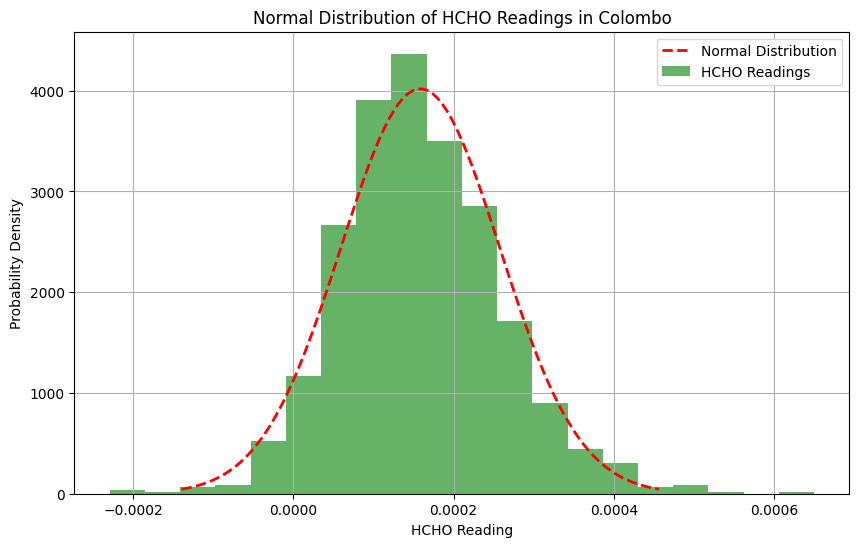

In [6]:
import numpy as np
from pyspark.sql.functions import col, mean
from scipy.stats import norm
import matplotlib.pyplot as plt

mean_hcho = colombo_data_pandas["HCHO Reading"].mean()
std_hcho = colombo_data_pandas["HCHO Reading"].std()

# Create a range of values for x-axis
x = np.linspace(mean_hcho - 3*std_hcho, mean_hcho + 3*std_hcho, 100)

# Calculate the corresponding probabilities for each value of x
y = norm.pdf(x, mean_hcho, std_hcho)

# Plot the histogram of HCHO readings
plt.figure(figsize=(10, 6))
plt.hist(colombo_data_pandas["HCHO Reading"], bins=20, density=True, alpha=0.6, color='g')

# Plot the normal distribution curve
plt.plot(x, y, 'r--', linewidth=2)

plt.title('Normal Distribution of HCHO Readings in Colombo')
plt.xlabel('HCHO Reading')
plt.ylabel('Probability Density')
plt.grid(True)
plt.legend(['Normal Distribution', 'HCHO Readings'])
plt.show()

We can see the average distribution of the mean is aroiund 0.0002 across 4 years, hence it has been used to fill the missing value

In [21]:
colombo_data = data.filter(col("Location") == "Colombo Proper")
mean_hcho = colombo_data.select(mean("HCHO Reading")).collect()[0][0]
colombo_data = colombo_data.fillna(mean_hcho, subset=["HCHO Reading"])


colombo_data_pandas = colombo_data.toPandas()
colombo_data_pandas.to_csv("colombo_hcho.csv", index=False)

repeat for all citites

In [59]:
data = spark.read.csv("uncleaned data/HCHO_data/col_mat_nuw_output.csv", header=False, inferSchema=True)
cols = ["HCHO Reading", "Location", "Current Date", "Next Date"]
data = data.toDF(*cols)
data.show()
city_data = data.filter(col("Location") == "Nuwara Eliya Proper")
mean_hcho = city_data.select(mean("HCHO Reading")).collect()[0][0]
city_data = city_data.fillna(mean_hcho, subset=["HCHO Reading"])


city_data_pandas = city_data.toPandas()
city_data_pandas.to_csv("Nuwara_Eliya_Proper_hcho.csv", index=False)
city_data.show()

+--------------------+--------------+------------+----------+
|        HCHO Reading|      Location|Current Date| Next Date|
+--------------------+--------------+------------+----------+
|1.969834395781014...|Colombo Proper|  2019-01-01|2019-01-02|
|2.625522171968594...|Colombo Proper|  2019-01-02|2019-01-03|
|9.852118897938794E-5|Colombo Proper|  2019-01-03|2019-01-04|
|2.099320518114242E-4|Colombo Proper|  2019-01-04|2019-01-05|
|1.785337298892930...|Colombo Proper|  2019-01-05|2019-01-06|
|1.082296700235670...|Colombo Proper|  2019-01-06|2019-01-07|
|3.926829280477309...|Colombo Proper|  2019-01-07|2019-01-08|
|9.153156350685351E-5|Colombo Proper|  2019-01-08|2019-01-09|
|1.205978992853015...|Colombo Proper|  2019-01-09|2019-01-10|
|1.297723562983258...|Colombo Proper|  2019-01-10|2019-01-11|
|2.239188166801278...|Colombo Proper|  2019-01-11|2019-01-12|
|1.569418094178759...|Colombo Proper|  2019-01-12|2019-01-13|
|                NULL|Colombo Proper|  2019-01-13|2019-01-14|
|1.33629

<h3>Check for outliers in each city</h3>

In [17]:
import pyspark
import pyspark.sql as pyspark_sql
from pyspark import SparkConf

sc = pyspark.SparkContext.getOrCreate()
spark = pyspark_sql.SparkSession(sc)


24/03/11 18:56:15 WARN Utils: Your hostname, Hammaads-MacBook-Air.local resolves to a loopback address: 127.0.0.1; using 192.168.1.140 instead (on interface en0)
24/03/11 18:56:15 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/03/11 18:56:16 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [26]:
data=spark.read.csv("cleaned data/Bibile_Monaragala_hcho.csv",header=True,inferSchema=True)
data.show()

+--------------------+------------------+------------+----------+
|        HCHO Reading|          Location|Current Date| Next Date|
+--------------------+------------------+------------+----------+
|1.264313797412045...|Bibile, Monaragala|  2019-01-01|2019-01-02|
|1.919914652467399E-5|Bibile, Monaragala|  2019-01-02|2019-01-03|
|2.811447935930283...|Bibile, Monaragala|  2019-01-03|2019-01-04|
|3.747998184385943E-5|Bibile, Monaragala|  2019-01-04|2019-01-05|
|-1.79826087934531...|Bibile, Monaragala|  2019-01-05|2019-01-06|
|1.457836896179902...|Bibile, Monaragala|  2019-01-06|2019-01-07|
|2.828590802546534...|Bibile, Monaragala|  2019-01-07|2019-01-08|
|1.264313797412045...|Bibile, Monaragala|  2019-01-08|2019-01-09|
|1.420850167050957...|Bibile, Monaragala|  2019-01-09|2019-01-10|
|1.264313797412045...|Bibile, Monaragala|  2019-01-10|2019-01-11|
|2.014587947072581E-5|Bibile, Monaragala|  2019-01-11|2019-01-12|
|1.582787663210183...|Bibile, Monaragala|  2019-01-12|2019-01-13|
|1.2643137

In [37]:
r=data.select("HCHO Reading").describe()
r.show()

+-------+--------------------+
|summary|        HCHO Reading|
+-------+--------------------+
|  count|                1826|
|   mean|1.264313797412028...|
| stddev|7.398431342501667E-5|
|    min|-2.39045708440244...|
|    max|5.348281140823137E-4|
+-------+--------------------+



In [30]:
from pyspark.sql.functions import mean,stddev,col,sqrt
df=data

mean_value = df.select(mean(col("HCHO Reading"))).collect()[0][0]
stddev_value = df.select(stddev(col("HCHO Reading"))).collect()[0][0]

# Define threshold for outliers (e.g., 3 standard deviations from the mean)
threshold = 3 * stddev_value

# Identify outliers
difference = sqrt(pow((col("HCHO Reading") - mean_value), 2))
outliers = df.filter(difference > threshold)

# Show outliers
outliers.show()
outliers.count()

+--------------------+------------------+------------+----------+
|        HCHO Reading|          Location|Current Date| Next Date|
+--------------------+------------------+------------+----------+
|4.183141429787661E-4|Bibile, Monaragala|  2019-07-03|2019-07-04|
|4.105507403533942E-4|Bibile, Monaragala|  2019-08-07|2019-08-08|
|-2.39045708440244...|Bibile, Monaragala|  2019-08-29|2019-08-30|
|-1.02826707006897...|Bibile, Monaragala|  2019-10-14|2019-10-15|
|-1.21090619359165...|Bibile, Monaragala|  2020-01-18|2020-01-19|
|4.111049981789254...|Bibile, Monaragala|  2020-02-05|2020-02-06|
|-1.00485084231338...|Bibile, Monaragala|  2020-02-25|2020-02-26|
|4.286214192743554...|Bibile, Monaragala|  2020-04-28|2020-04-29|
|3.845334830933597E-4|Bibile, Monaragala|  2020-07-16|2020-07-17|
| 4.39565224177669E-4|Bibile, Monaragala|  2020-12-13|2020-12-14|
|3.646058886863877E-4|Bibile, Monaragala|  2021-03-17|2021-03-18|
|-1.11445379233194...|Bibile, Monaragala|  2021-04-27|2021-04-28|
|3.5443292

34

There are outliers which are >3times standard deviation

Need to create a function where it removes outliers in all the datasets first for hcho reading

In [35]:
def remove_outliers(df):
    filtered_data=df
    mean = filtered_data["HCHO Reading"].mean()
    std = filtered_data["HCHO Reading"].std()

    threshold = mean + 3 * std  

    preprocessed_data = filtered_data[filtered_data["HCHO Reading"] <= threshold]
    preprocessed_data.boxplot(column="HCHO Reading", figsize=(10, 6))
    preprocessed_data.hist(column="HCHO Reading", figsize=(10, 6))


    return cleaned_data


Visualising the differences after removing outliers

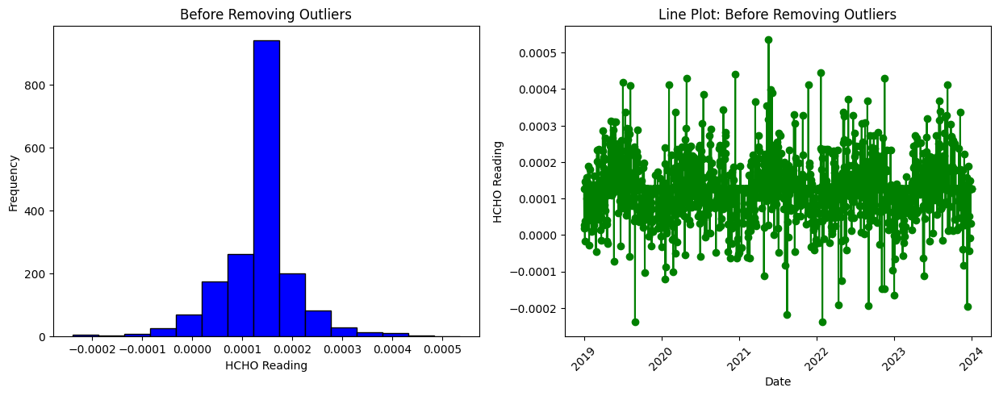

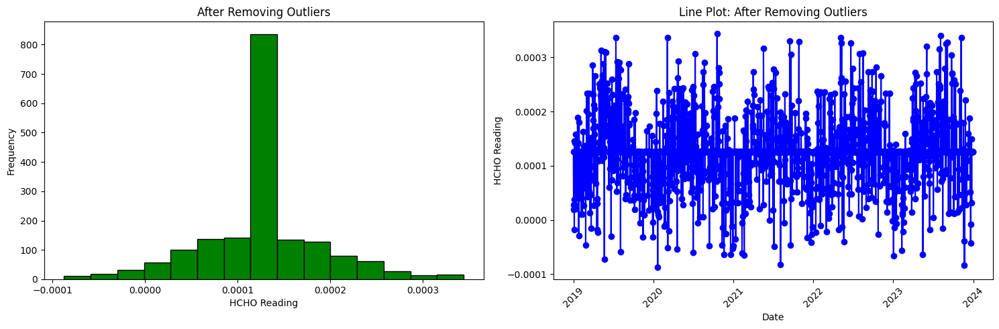

24/03/18 12:48:27 WARN Executor: Issue communicating with driver in heartbeater
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.SparkThreadUtils$.awaitResult(SparkThreadUtils.scala:56)
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:310)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:101)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:85)
	at org.apache.spark.storage.BlockManagerMaster.registerBlockManager(BlockManagerMaster.scala:80)
	at org.apache.spark.storage.BlockManager.reregister(BlockManager.scala:642)
	at org.apache.spark.executor.Executor.reportHeartBeat(Executor.scala:1223)
	at org.apache.spark.executor.Executor.$anonfun$heartbeater$1(Executor.scala:295)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at org.apache.spark.util.Utils$.logUncaughtExceptions(Utils.scala:1928)

In [36]:
pd_df_before = df.toPandas()

plt.figure(figsize=(15, 5))

# Histogram
plt.subplot(1, 2, 1)
plt.hist(pd_df_before["HCHO Reading"], bins=15, color='blue', edgecolor='black')
plt.title('Before Removing Outliers')
plt.xlabel('HCHO Reading')
plt.ylabel('Frequency')

# Line Plot
plt.subplot(1, 2, 2)
plt.plot(pd_df_before["Current Date"], pd_df_before["HCHO Reading"], color='green', marker='o')
plt.title('Line Plot: Before Removing Outliers')
plt.xlabel('Date')
plt.ylabel('HCHO Reading')
plt.xticks(rotation=45)

# Remove outliers
cleaned_df = remove_outliers(df)

# Convert cleaned PySpark DataFrame to Pandas DataFrame for plotting
pd_df_after = cleaned_df.toPandas()

# Plot after removing outliers
plt.figure(figsize=(15, 5))

# Histogram
plt.subplot(1, 2, 1)
plt.hist(pd_df_after["HCHO Reading"], bins=15, color='green', edgecolor='black')
plt.title('After Removing Outliers')
plt.xlabel('HCHO Reading')
plt.ylabel('Frequency')

# Line Plot
plt.subplot(1, 2, 2)
plt.plot(pd_df_after["Current Date"], pd_df_after["HCHO Reading"], color='blue', marker='o')
plt.title('Line Plot: After Removing Outliers')
plt.xlabel('Date')
plt.ylabel('HCHO Reading')
plt.xticks(rotation=45)

# Show plots
plt.tight_layout()
plt.show()

need to repeat for all cities in the cleaned dataset folder

In [14]:
import os
import pandas as pd
import numpy as np

from pyspark.sql.functions import mean, stddev, col, sqrt

input_folder = "cleaned data"
output_folder = "removed_outliers_data"

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

file_list = os.listdir(input_folder)

# Process each file
for file_name in file_list:
    if file_name.endswith('.csv'):
        input_file_path = os.path.join(input_folder, file_name)
        df = spark.read.csv(input_file_path, header=True, inferSchema=True)
        cleaned_df = remove_outliers(df)
        data=cleaned_df.toPandas()
        data.to_csv(f"{output_folder}/{file_name}", index=False)

removed the contents in the cleaned_data and resaved with the removed outliers data


<h3>Check for inconsistencies in data types</h3>

check for wrong ranges in data type ex hcho readings cannot be negative

In [22]:
file_path = os.path.join("cleaned data/colombo_hcho.csv")
df = spark.read.csv(file_path, header=True, inferSchema=True)

negative_hcho = df.filter(col("HCHO Reading") < 0)
if negative_hcho.count() > 0:
    print("Negative readings count: ",negative_hcho.count())
df.count()

Negative readings count:  45


1802

function to remove the negative values

In [23]:
def remove_negative_hcho(df):
    return df.filter(col("HCHO Reading") >= 0)


In [25]:
if not os.path.exists(output_folder):
    os.makedirs(output_folder)
    
for file_name in file_list:
    if file_name.endswith('.csv'):
        # Read CSV file into Spark DataFrame
        input_file_path = os.path.join(input_folder, file_name)
        df = spark.read.csv(input_file_path, header=True, inferSchema=True)

        cleaned_df = remove_negative_hcho(df)

        output_file_path = os.path.join(output_folder, file_name)
        data=cleaned_df.toPandas()
        data.to_csv(f"{output_folder}/{file_name}", index=False)

        print("Validated and saved the values to: ", output_file_path)


Validated and saved the values to:  removed_outliers_data/Jaffna_Proper_hcho.csv
Validated and saved the values to:  removed_outliers_data/Deniyaya_Matara_hcho.csv
Validated and saved the values to:  removed_outliers_data/Kandy_Proper_hcho.csv
Validated and saved the values to:  removed_outliers_data/Bibile_Monaragala_hcho.csv
Validated and saved the values to:  removed_outliers_data/Nuwara_Eliya_Proper_hcho.csv
Validated and saved the values to:  removed_outliers_data/Kurunegala_Proper_hcho.csv
Validated and saved the values to:  removed_outliers_data/colombo_hcho.csv


resaved the values to the cleaned dataset

need to view the graphs after validation

Text(0, 0.5, 'Frequency')

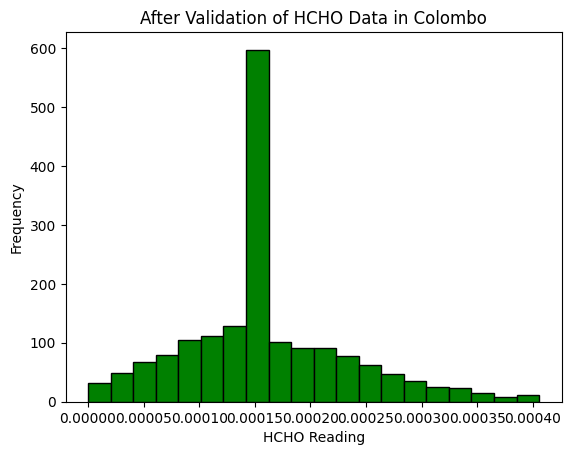

In [6]:
df=spark.read.csv("cleaned data/colombo_hcho.csv",header=True,inferSchema=True)
data=df.toPandas()
plt.hist(data["HCHO Reading"], bins=20, color='green', edgecolor='black')
plt.title('After Validation of HCHO Data in Colombo')
plt.xlabel('HCHO Reading')
plt.ylabel('Frequency')

<h4>Validate the date</h4>

In [14]:
from pyspark.sql.functions import col

data=spark.read.csv("cleaned data/colombo_hcho.csv",header=True,inferSchema=True)
duplicate_dates = data.groupBy("Next Date").count().filter(col("count") >1)
duplicate_dates.show()


+---------+-----+
|Next Date|count|
+---------+-----+
+---------+-----+



24/03/19 13:02:56 WARN Executor: Issue communicating with driver in heartbeater
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.SparkThreadUtils$.awaitResult(SparkThreadUtils.scala:56)
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:310)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:101)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:85)
	at org.apache.spark.storage.BlockManagerMaster.registerBlockManager(BlockManagerMaster.scala:80)
	at org.apache.spark.storage.BlockManager.reregister(BlockManager.scala:642)
	at org.apache.spark.executor.Executor.reportHeartBeat(Executor.scala:1223)
	at org.apache.spark.executor.Executor.$anonfun$heartbeater$1(Executor.scala:295)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at org.apache.spark.util.Utils$.logUncaughtExceptions(Utils.scala:1928)

24/03/19 13:03:06 ERROR Inbox: Ignoring error
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.SparkThreadUtils$.awaitResult(SparkThreadUtils.scala:56)
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:310)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRefByURI(RpcEnv.scala:102)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRef(RpcEnv.scala:110)
	at org.apache.spark.util.RpcUtils$.makeDriverRef(RpcUtils.scala:36)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.driverEndpoint$lzycompute(BlockManagerMasterEndpoint.scala:124)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.org$apache$spark$storage$BlockManagerMasterEndpoint$$driverEndpoint(BlockManagerMasterEndpoint.scala:123)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.isExecutorAlive$lzycompute$1(BlockManagerMasterEndpoint.scala:688)
	at org.apache.spark.storage.BlockManagerMasterE

no dulpicate date entries for both columns

In [20]:
from pyspark.sql.functions import col, to_date
from pyspark.sql.types import DateType

data = spark.read.csv("cleaned data/colombo_hcho.csv", header=True, inferSchema=True)
data = data.withColumn("Current Date", to_date(col("Current Date"), "yyyy-MM-dd"))

invalid_dates = data.filter(col("Current Date").isNull())

invalid_dates.show()

+------------+--------+------------+---------+
|HCHO Reading|Location|Current Date|Next Date|
+------------+--------+------------+---------+
+------------+--------+------------+---------+



24/03/19 13:05:26 ERROR Inbox: Ignoring error
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.SparkThreadUtils$.awaitResult(SparkThreadUtils.scala:56)
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:310)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRefByURI(RpcEnv.scala:102)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRef(RpcEnv.scala:110)
	at org.apache.spark.util.RpcUtils$.makeDriverRef(RpcUtils.scala:36)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.driverEndpoint$lzycompute(BlockManagerMasterEndpoint.scala:124)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.org$apache$spark$storage$BlockManagerMasterEndpoint$$driverEndpoint(BlockManagerMasterEndpoint.scala:123)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.isExecutorAlive$lzycompute$1(BlockManagerMasterEndpoint.scala:688)
	at org.apache.spark.storage.BlockManagerMasterE

In [6]:
from pyspark.sql.functions import col, year, month, dayofmonth

data = spark.read.csv("cleaned data/colombo_hcho.csv", header=True, inferSchema=True)
data = data.withColumn("year", year(col("Current Date")))
data = data.withColumn("month", month(col("Current Date")))
data = data.withColumn("day", dayofmonth(col("Current Date")))

data.select("month").distinct().show()
data.select("year").distinct().show()
data.select("day").distinct().show()

+-----+
|month|
+-----+
|   12|
|    1|
|    6|
|    3|
|    5|
|    9|
|    4|
|    8|
|    7|
|   10|
|   11|
|    2|
+-----+

+----+
|year|
+----+
|2023|
|2022|
|2019|
|2020|
|2021|
+----+

+---+
|day|
+---+
| 31|
| 28|
| 26|
| 27|
| 12|
| 22|
|  1|
| 13|
|  6|
| 16|
|  3|
| 20|
|  5|
| 19|
| 15|
|  9|
| 17|
|  4|
|  8|
| 23|
+---+
only showing top 20 rows



date is of correct range

need to create a function and update for other csv also

In [11]:
from pyspark.sql.functions import col, to_date
def validate_date(df):
    df = df.withColumn("Current Date", to_date(col("Current Date"), "yyyy-MM-dd"))
    df = df.dropDuplicates(["Current Date"])
    df = df.filter(col("Current Date").isNotNull())

    df = df.withColumn("Next Date", to_date(col("Next Date"), "yyyy-MM-dd"))
    df = df.dropDuplicates(["Next Date"])
    df = df.filter(col("Next Date").isNotNull())
    return df


In [16]:
import os
input_folder = "cleaned data"
output_folder = "validated_data"

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

file_list = os.listdir(input_folder)

# Process each file
for file_name in file_list:
    if file_name.endswith('.csv'):
        input_file_path = os.path.join(input_folder, file_name)
        df = spark.read.csv(input_file_path, header=True, inferSchema=True)
        cleaned_df = validate_date(df)
        
        
        output_file_path = os.path.join(output_folder, file_name)
        print("Validated date columns the values to: ", output_file_path)
        cleaned_df.toPandas().to_csv(output_file_path, index=False)

Validated date columns the values to:  validated_data/Jaffna_Proper_hcho.csv
Validated date columns the values to:  validated_data/Deniyaya_Matara_hcho.csv
Validated date columns the values to:  validated_data/Kandy_Proper_hcho.csv
Validated date columns the values to:  validated_data/Bibile_Monaragala_hcho.csv
Validated date columns the values to:  validated_data/Nuwara_Eliya_Proper_hcho.csv
Validated date columns the values to:  validated_data/Kurunegala_Proper_hcho.csv
Validated date columns the values to:  validated_data/colombo_hcho.csv


data validation is completed

<h3>EDA</h3>

<h4>Descrptive statistics<h4>

displaying the summary of HCHO reading for colombo

In [18]:
data=spark.read.csv("preprocessed_data/colombo_hcho.csv",header=True,inferSchema=True)
data.select("HCHO Reading").describe().show()

+-------+--------------------+
|summary|        HCHO Reading|
+-------+--------------------+
|  count|                1757|
|   mean|1.616377580572035...|
| stddev| 7.26429302558287E-5|
|    min|2.111934367094221...|
|    max|4.057500868150313E-4|
+-------+--------------------+



to compare between cities i will create a table, which would aid for comparison

In [108]:
def generate_summary(data):
    summary = data.describe().toPandas()

    median = data.selectExpr("percentile_approx(`HCHO Reading`, 0.5)").collect()[0][0]
    q1 = data.selectExpr("percentile_approx(`HCHO Reading`, 0.75)").collect()[0][0]
    q3 = data.selectExpr("percentile_approx(`HCHO Reading`, 0.25)").collect()[0][0]

    count = float(summary.iloc[0, 1])
    mean = float(summary.iloc[1, 1])
    std = float(summary.iloc[2, 1])
    min_val = float(summary.iloc[3, 1])
    max_val = float(summary.iloc[4, 1])

    location = data.select("Location").collect()[0][0]

    stats = {
        "Location": location,
        "count": count,
        "mean": mean,
        "std": std,
        "min": min_val,
        "max": max_val,
        "median": median,
        "q1": q1,
        "q3": q3
    }

    return stats


functions to extract the statistics and load to the dataframe

In [109]:
def merge_stats(stats_list):
    stats_dict = {}
    for stats in stats_list:
        location = stats['Location']
        del stats['Location'] 
        stats_dict[location] = stats

    df = pd.DataFrame(stats_dict).transpose()

    return df

In [123]:
all_stats = []
import os
input_folder = "preprocessed_data"
file_list = os.listdir(input_folder)

# Process each file
for file_name in file_list:
    if file_name.endswith('.csv'):
        input_file_path = os.path.join(input_folder, file_name)
        df = spark.read.csv(input_file_path, header=True, inferSchema=True)
        stats = generate_summary(df)
        all_stats.append(stats)
data = merge_stats(all_stats)
data["Location"] = data.index
data = data.reset_index(drop=True)

In [124]:
data

,count,mean,std,min,max,median,q1,q3,Location
0,1746.0,0.000110,0.000054,4.103467e-07,0.000314,0.000109,0.000131,0.000077,Jaffna Proper
1,1688.0,0.000096,0.000045,8.485600e-08,0.000304,0.000092,0.000092,0.000089,"Deniyaya, Matara"
2,1701.0,0.000114,0.000050,1.569671e-07,0.000310,0.000106,0.000120,0.000106,Kandy Proper
3,1729.0,0.000132,0.000057,1.461232e-07,0.000344,0.000126,0.000148,0.000114,"Bibile, Monaragala"
4,1702.0,0.000092,0.000036,4.363303e-07,0.000241,0.000088,0.000088,0.000088,Nuwara Eliya Proper
5,1749.0,0.000137,0.000058,1.433376e-07,0.000347,0.000134,0.000157,0.000108,Kurunegala Proper
6,1757.0,0.000162,0.000073,2.111934e-07,0.000406,0.000159,0.000192,0.000121,Colombo Proper


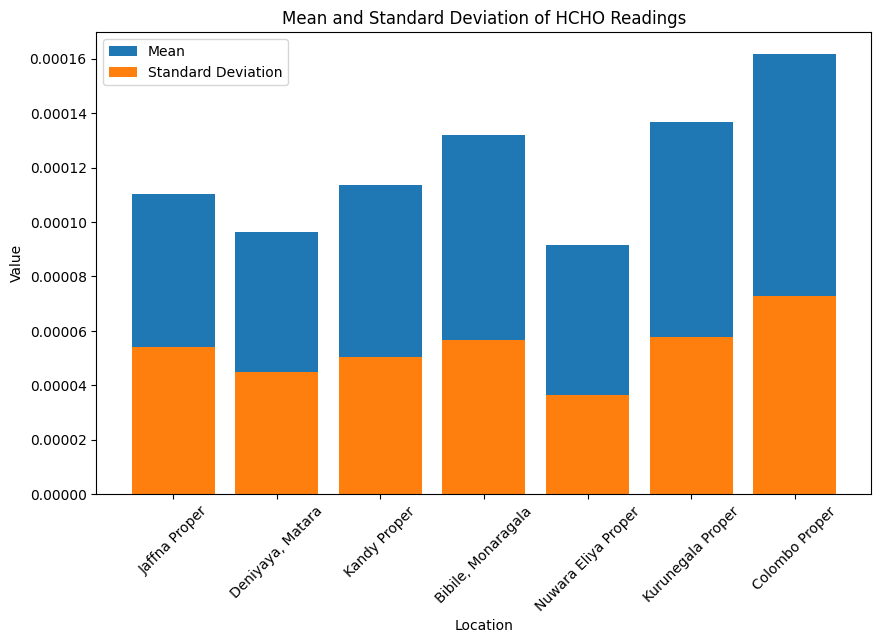

In [104]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.bar(data["Location"], data["mean"])
plt.bar(data["Location"], data["std"])
plt.title("Mean and Standard Deviation of HCHO Readings")
plt.xlabel("Location")
plt.ylabel("Value")
plt.xticks(rotation=45)
plt.legend(["Mean", "Standard Deviation"])
plt.show()


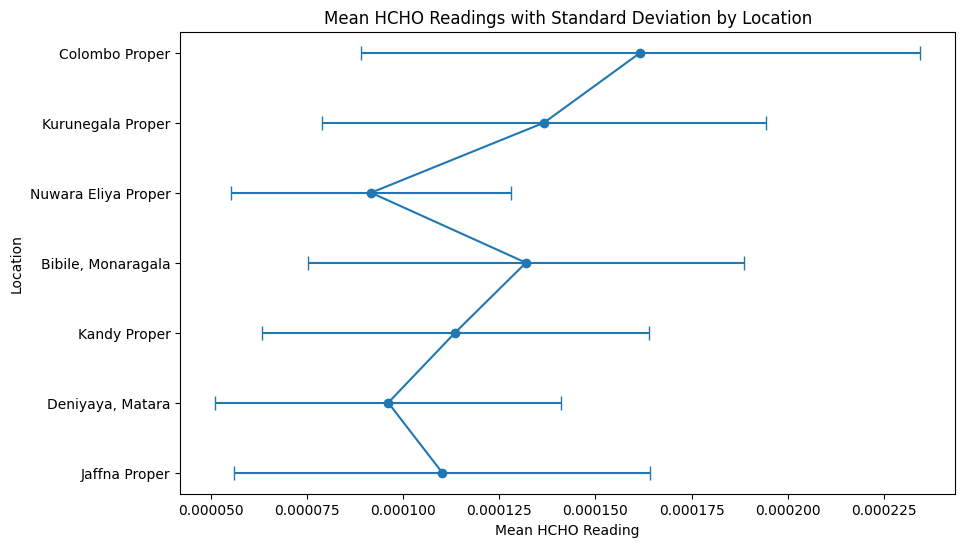

In [91]:
plt.figure(figsize=(10, 6))
plt.errorbar(df["mean"], df["Location"], xerr=df["std"], fmt='o', linestyle='-', capsize=5)
plt.title("Mean HCHO Readings with Standard Deviation by Location")
plt.xlabel("Mean HCHO Reading")
plt.ylabel("Location")
plt.show()


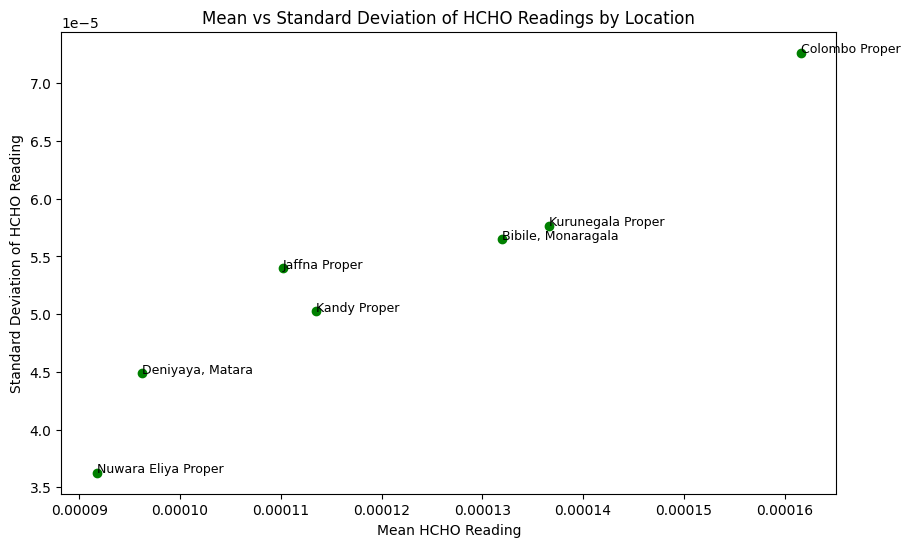

In [100]:
plt.figure(figsize=(10, 6))
plt.scatter(df["mean"], df["std"], color="green")
plt.title("Mean vs Standard Deviation of HCHO Readings by Location")
plt.xlabel("Mean HCHO Reading")
plt.ylabel("Standard Deviation of HCHO Reading")
for i, location in enumerate(df["Location"]):
    plt.text(df["mean"][i], df["std"][i], location, fontsize=9)
plt.show()


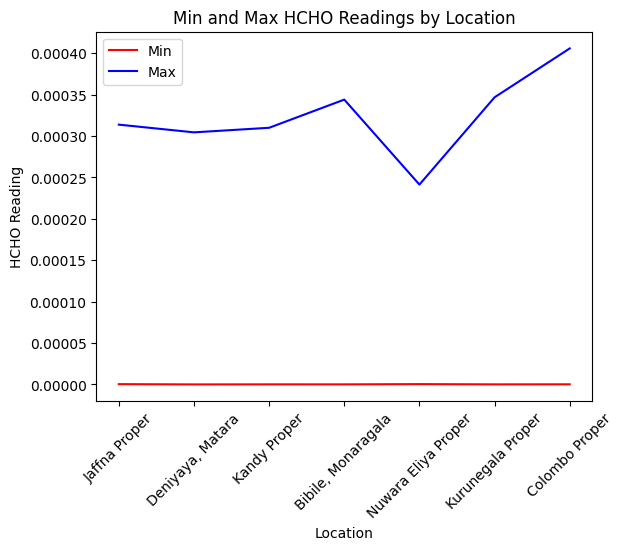

In [107]:
plt.plot(df["Location"], df["min"], color="red")
plt.plot(df["Location"], df["max"], color="blue")
plt.title("Min and Max HCHO Readings by Location")
plt.xlabel("Location")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.legend(["Min", "Max"])
plt.show()

In [122]:
data

DataFrame[HCHO Reading: double, Current Date: date, Next Date: date]

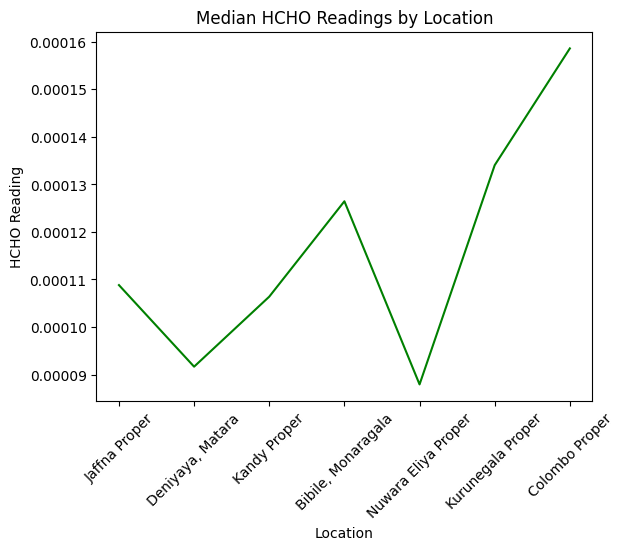

In [128]:
plt.plot(data["Location"], data["median"], color="green")
plt.title("Median HCHO Readings by Location")
plt.xlabel("Location")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.show()

# Show plot

<h4>Visualisating data distribution</h4>

create a dataframe by merging all the cities with the date

In [252]:
import os
def merge_dataframe(df, new_df):
    location=new_df.select("Location").collect()[0][0]
    df=df.drop("Location","Next Date")
    df = df.join(new_df, on="Current Date", how="outer")
    df = df.withColumnRenamed("HCHO Reading", f"{location}")
    return df

input_folder = "preprocessed_data"
count = 0
data = None

for file_name in os.listdir(input_folder):
    if file_name.endswith('.csv'):
        input_file_path = os.path.join(input_folder, file_name)
        df = spark.read.csv(input_file_path, header=True, inferSchema=True)
        
        if count == 0:
            data = df
            location=df.select("Location").collect()[0][0]
            data=data.withColumnRenamed("HCHO Reading", f"{location}")
            count += 1
        else:
            data = merge_dataframe(data, df)
            data=data.drop("Location","Next Date")
            count += 1

data.show()


+------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|Current Date|   Kurunegala Proper|        Kandy Proper|       Jaffna Proper|      Colombo Proper| Nuwara Eliya Proper|    Deniyaya, Matara|  Bibile, Monaragala|
+------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|  2019-01-01|8.829725542537962E-5|                NULL|5.830909719406619E-5|                NULL|                NULL|                NULL|                NULL|
|  2019-01-02|   1.370787402778E-4|9.220391253917748E-5|   1.017952795536E-4|   2.625522171968E-4|                NULL|5.803530712000793E-6|1.919914652467399E-5|
|  2019-01-03|   1.480085027113E-4|                NULL| 3.93133105404262E-5|9.852118897938794E-5|   1.908293886956E-4|   2.362357772653E-4|2.811447935930284E-5|
|  2019-01-04|              

In [253]:
df=data.toPandas()

Once we convert the merged pyspark dataframe to pandas we can create visualisation

<AxesSubplot: xlabel='Current Date'>

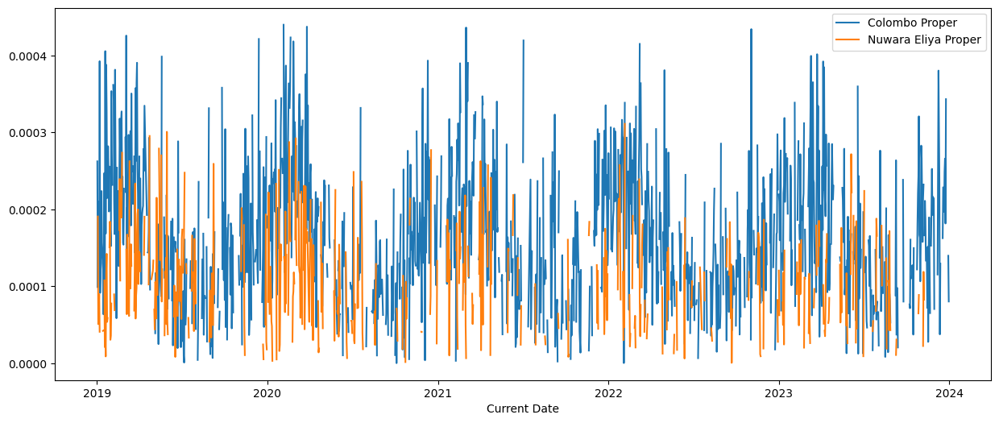

In [254]:
df.plot(x="Current Date", y=["Colombo Proper", "Nuwara Eliya Proper"], kind="line", figsize=(15, 6))

In [255]:
df

,Current Date,Kurunegala Proper,Kandy Proper,Jaffna Proper,Colombo Proper,Nuwara Eliya Proper,"Deniyaya, Matara","Bibile, Monaragala"
0,2019-01-01,0.000088,NaN,0.000058,NaN,NaN,NaN,NaN
1,2019-01-02,0.000137,0.000092,0.000102,0.000263,NaN,0.000006,0.000019
2,2019-01-03,0.000148,NaN,0.000039,0.000099,0.000191,0.000236,0.000028
3,2019-01-04,NaN,0.000191,NaN,0.000210,0.000051,0.000064,0.000037
4,2019-01-05,0.000249,0.000122,0.000159,0.000179,0.000065,0.000053,NaN
...,...,...,...,...,...,...,...,...
1692,2023-12-27,0.000075,NaN,NaN,0.000118,NaN,0.000228,NaN
1693,2023-12-28,NaN,NaN,0.000051,NaN,NaN,NaN,NaN
1694,2023-12-29,NaN,NaN,0.000127,NaN,NaN,NaN,NaN
1695,2023-12-30,0.000158,0.000056,0.000117,0.000140,NaN,0.000116,NaN


In [256]:
df[df["Jaffna Proper"]>df["Jaffna Proper"].describe()["max"]]

,Current Date,Kurunegala Proper,Kandy Proper,Jaffna Proper,Colombo Proper,Nuwara Eliya Proper,"Deniyaya, Matara","Bibile, Monaragala"


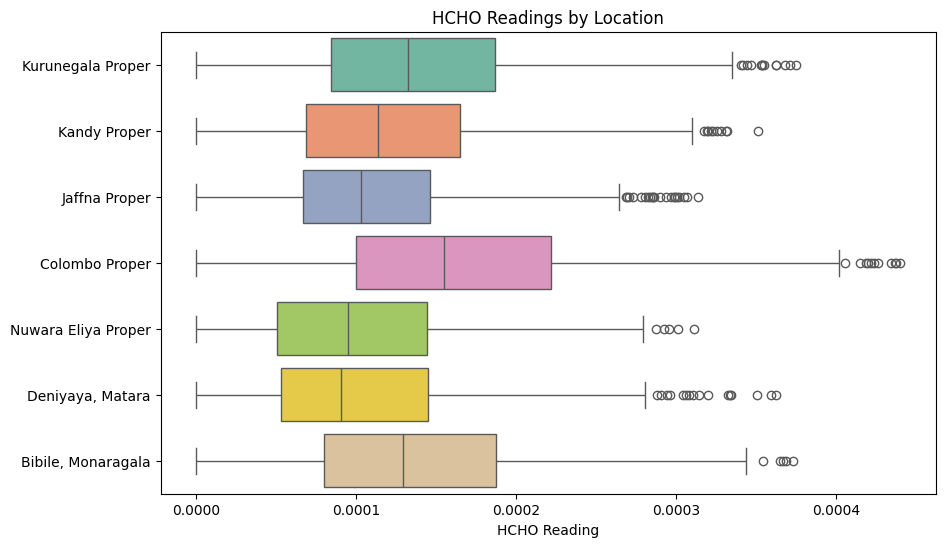

In [257]:
import seaborn as sns
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, orient="h", palette="Set2")
plt.title("HCHO Readings by Location")
plt.xlabel("HCHO Reading")

plt.show()


we can see that there are values greater than Q3, however since its not only a few number of records we can say that this is not a mistake and thus is required for the investigation

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
columns=["HCHO Reading","Location","Current Date","Next Date"]
data=pd.read_csv("uncleaned data/HCHO_data/mon_kur_jaf_output.csv")
data.columns=columns
data.drop("Next Date",axis=1,inplace=True)  


In [6]:
jaffna_data = data[data['Location'] == 'Jaffna Proper']
jaffna_data.dropna(inplace=True)
# Create a box plot


/var/folders/s3/k3nh4t5j0pl3086gd494qhgh0000gn/T/ipykernel_59702/1641147281.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  jaffna_data.dropna(inplace=True)


In [25]:
jaffna_data

,HCHO Reading,Location,Current Date
3651,5.830910e-05,Jaffna Proper,2019-01-01
3652,1.017953e-04,Jaffna Proper,2019-01-02
3653,3.931331e-05,Jaffna Proper,2019-01-03
3654,-2.383985e-06,Jaffna Proper,2019-01-04
3655,1.589137e-04,Jaffna Proper,2019-01-05
...,...,...,...
5471,-7.696313e-08,Jaffna Proper,2023-12-26
5473,5.139770e-05,Jaffna Proper,2023-12-28
5474,1.267235e-04,Jaffna Proper,2023-12-29
5475,1.166590e-04,Jaffna Proper,2023-12-30


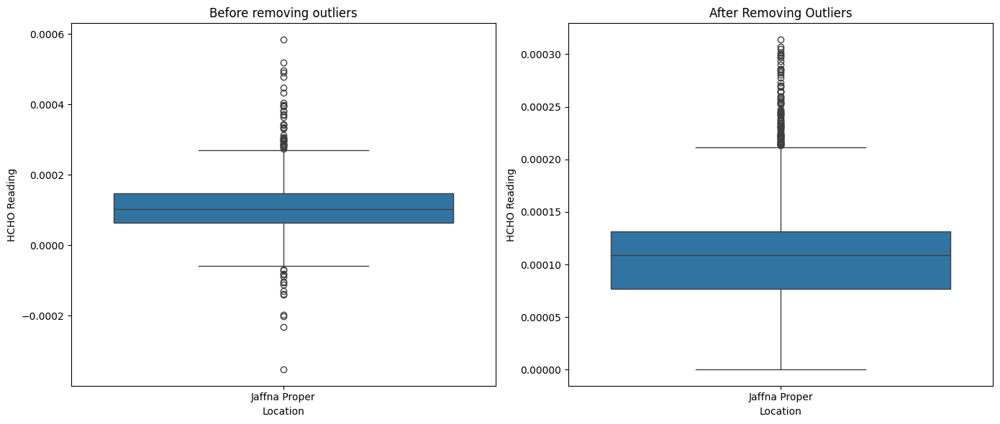

In [259]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create subplots with 1 row and 2 columns
plt.figure(figsize=(14, 6))

# Plot 1: Before removing outliers
plt.subplot(1, 2, 1)
sns.boxplot(x='Location', y='HCHO Reading', data=jaffna_data)
plt.title("Before removing outliers")
plt.xlabel("Location")
plt.ylabel("HCHO Reading")

# Plot 2: After removing outliers
plt.subplot(1, 2, 2)
sns.boxplot(x='Location', y='HCHO Reading', data=jf)
plt.title("After Removing Outliers")
plt.xlabel("Location")
plt.ylabel("HCHO Reading")

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()


plot to show why we ledt certain outliers

In [39]:
df

,Current Date,Jaffna Proper,"Deniyaya, Matara",Kandy Proper,"Bibile, Monaragala",Nuwara Eliya Proper,Kurunegala Proper,Colombo Proper
0,2019-01-01,0.000058,0.000092,0.000176,0.000126,0.000088,0.000088,0.000197
1,2019-01-02,0.000102,0.000006,0.000092,0.000019,0.000088,0.000137,0.000263
2,2019-01-03,0.000039,0.000236,0.000106,0.000028,0.000191,0.000148,0.000099
3,2019-01-04,NaN,0.000064,0.000191,0.000037,0.000051,NaN,0.000210
4,2019-01-05,0.000159,0.000053,0.000122,NaN,0.000065,0.000249,0.000179
...,...,...,...,...,...,...,...,...
1821,2023-12-27,0.000109,0.000228,0.000106,0.000126,0.000088,0.000075,0.000118
1822,2023-12-28,0.000051,0.000092,0.000106,0.000126,0.000088,0.000134,0.000159
1823,2023-12-29,0.000127,0.000092,0.000106,0.000126,0.000088,0.000134,0.000159
1824,2023-12-30,0.000117,0.000116,0.000056,0.000126,0.000088,0.000158,0.000140


creating visualisations based on date

In [260]:

df['Current Date'] = pd.to_datetime(df['Current Date'])

# Extract year, month, day, and day of the week from the 'Current Date' column
df['Year'] = df['Current Date'].dt.year
df['Month'] = df['Current Date'].dt.month
df["Day"] = df["Current Date"].dt.day
df["Day of week"] = df["Current Date"].dt.dayofweek



In [261]:
df

,Current Date,Kurunegala Proper,Kandy Proper,Jaffna Proper,Colombo Proper,Nuwara Eliya Proper,"Deniyaya, Matara","Bibile, Monaragala",Year,Month,Day,Day of week
0,2019-01-01,0.000088,NaN,0.000058,NaN,NaN,NaN,NaN,2019,1,1,1
1,2019-01-02,0.000137,0.000092,0.000102,0.000263,NaN,0.000006,0.000019,2019,1,2,2
2,2019-01-03,0.000148,NaN,0.000039,0.000099,0.000191,0.000236,0.000028,2019,1,3,3
3,2019-01-04,NaN,0.000191,NaN,0.000210,0.000051,0.000064,0.000037,2019,1,4,4
4,2019-01-05,0.000249,0.000122,0.000159,0.000179,0.000065,0.000053,NaN,2019,1,5,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1692,2023-12-27,0.000075,NaN,NaN,0.000118,NaN,0.000228,NaN,2023,12,27,2
1693,2023-12-28,NaN,NaN,0.000051,NaN,NaN,NaN,NaN,2023,12,28,3
1694,2023-12-29,NaN,NaN,0.000127,NaN,NaN,NaN,NaN,2023,12,29,4
1695,2023-12-30,0.000158,0.000056,0.000117,0.000140,NaN,0.000116,NaN,2023,12,30,5


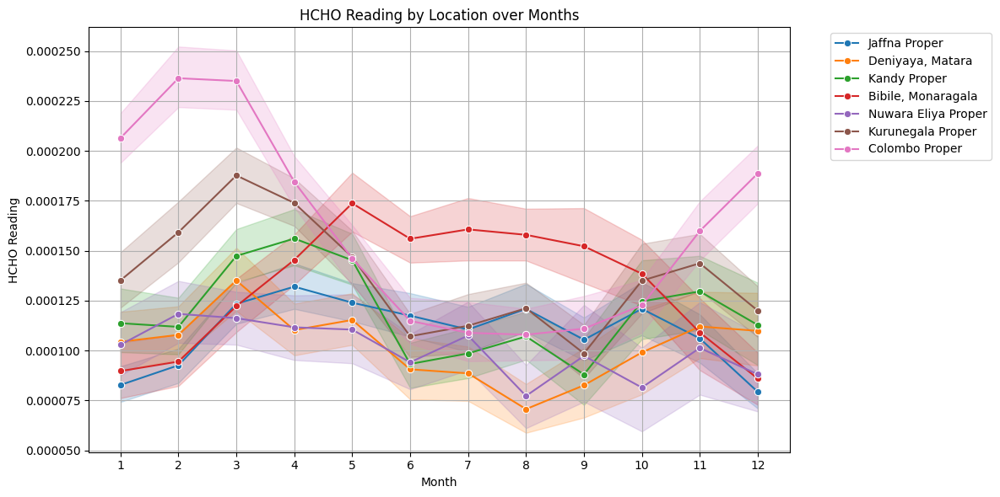

/var/folders/s3/k3nh4t5j0pl3086gd494qhgh0000gn/T/ipykernel_59702/2117569900.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=melted_df, x='Month', y='HCHO Reading', hue='Location', ci=None,palette="magma")


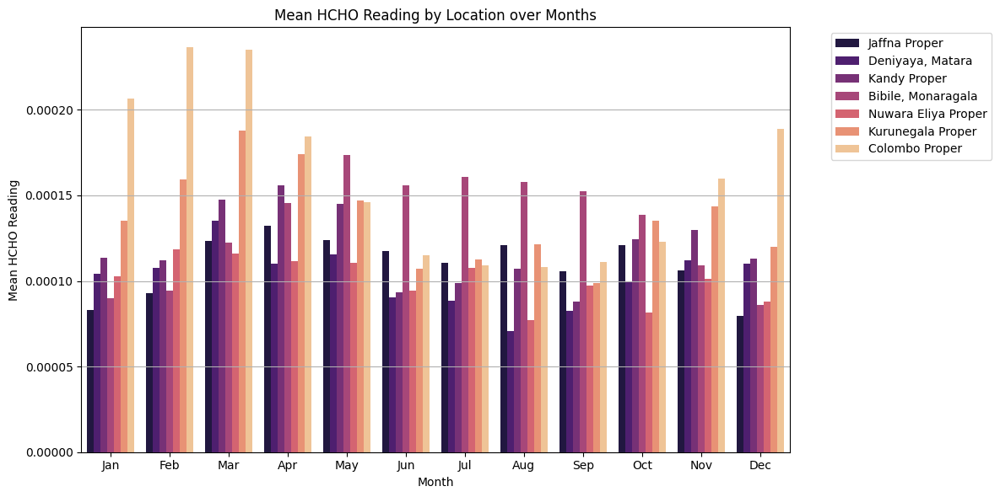

In [262]:
melted_df = pd.melt(df, id_vars=['Month'], value_vars=['Jaffna Proper', 'Deniyaya, Matara', 'Kandy Proper', 
                                                     'Bibile, Monaragala', 'Nuwara Eliya Proper', 
                                                     'Kurunegala Proper', 'Colombo Proper'], 
                     var_name='Location', value_name='HCHO Reading')

plt.figure(figsize=(12, 6))
sns.lineplot(data=melted_df, x='Month', y='HCHO Reading', hue='Location', marker='o')
plt.title('HCHO Reading by Location over Months')
plt.xlabel('Month')
plt.ylabel('HCHO Reading')
plt.xticks(range(1, 13))
plt.grid(True)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
sns.barplot(data=melted_df, x='Month', y='HCHO Reading', hue='Location', ci=None,palette="magma")
plt.title('Mean HCHO Reading by Location over Months')
plt.xlabel('Month')
plt.ylabel('Mean HCHO Reading')
plt.xticks(range(0, 12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(axis='y')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [263]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='Day of Week', y='HCHO Reading', bins=7, stat='density', kde=True)
plt.title("Distribution of HCHO Readings by Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Density")
plt.xticks(range(1, 8), ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.tight_layout()
plt.show()

ValueError: Could not interpret value `Day of Week` for `x`. An entry with this name does not appear in `data`.

<Figure size 1000x600 with 0 Axes>

In [264]:
df

,Current Date,Kurunegala Proper,Kandy Proper,Jaffna Proper,Colombo Proper,Nuwara Eliya Proper,"Deniyaya, Matara","Bibile, Monaragala",Year,Month,Day,Day of week
0,2019-01-01,0.000088,NaN,0.000058,NaN,NaN,NaN,NaN,2019,1,1,1
1,2019-01-02,0.000137,0.000092,0.000102,0.000263,NaN,0.000006,0.000019,2019,1,2,2
2,2019-01-03,0.000148,NaN,0.000039,0.000099,0.000191,0.000236,0.000028,2019,1,3,3
3,2019-01-04,NaN,0.000191,NaN,0.000210,0.000051,0.000064,0.000037,2019,1,4,4
4,2019-01-05,0.000249,0.000122,0.000159,0.000179,0.000065,0.000053,NaN,2019,1,5,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1692,2023-12-27,0.000075,NaN,NaN,0.000118,NaN,0.000228,NaN,2023,12,27,2
1693,2023-12-28,NaN,NaN,0.000051,NaN,NaN,NaN,NaN,2023,12,28,3
1694,2023-12-29,NaN,NaN,0.000127,NaN,NaN,NaN,NaN,2023,12,29,4
1695,2023-12-30,0.000158,0.000056,0.000117,0.000140,NaN,0.000116,NaN,2023,12,30,5


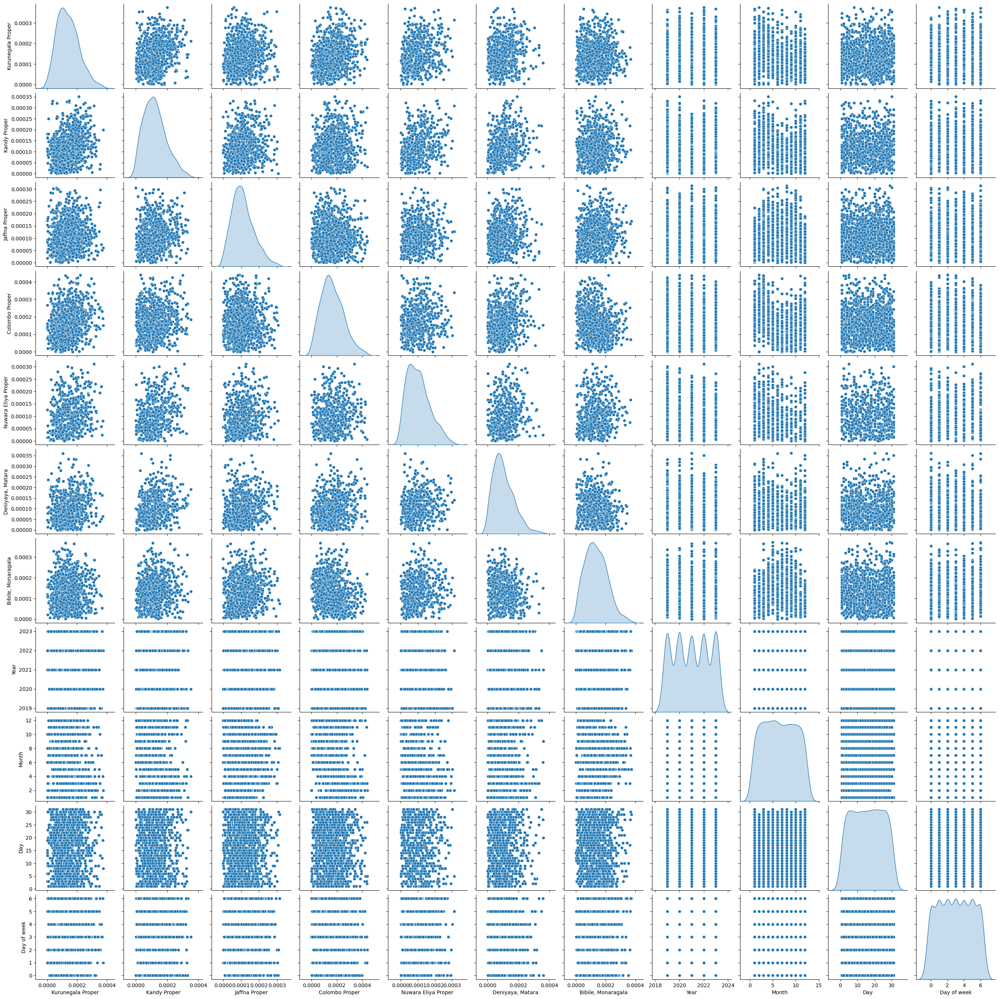

In [265]:
sns.pairplot(df, diag_kind='kde')
plt.show()

In [85]:
melted__day_df

,Day of Week,Location,HCHO Reading,Weekend
0,3,Jaffna Proper,0.000058,False
1,4,Jaffna Proper,0.000102,False
2,5,Jaffna Proper,0.000039,False
3,6,Jaffna Proper,NaN,True
4,7,Jaffna Proper,0.000159,True
...,...,...,...,...
12777,4,Colombo Proper,0.000118,False
12778,5,Colombo Proper,0.000159,False
12779,6,Colombo Proper,0.000159,True
12780,7,Colombo Proper,0.000140,True


([0, 1, 2, 3, 4, 5, 6],
 [Text(0, 0, 'Jaffna Proper'),
  Text(1, 0, 'Deniyaya, Matara'),
  Text(2, 0, 'Kandy Proper'),
  Text(3, 0, 'Bibile, Monaragala'),
  Text(4, 0, 'Nuwara Eliya Proper'),
  Text(5, 0, 'Kurunegala Proper'),
  Text(6, 0, 'Colombo Proper')])

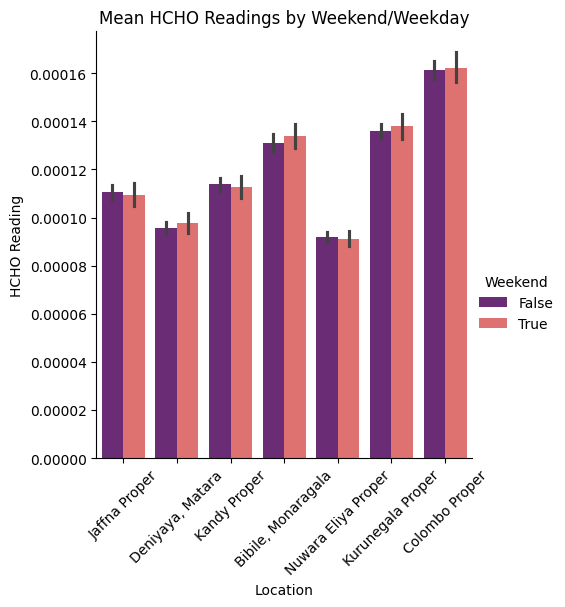

In [266]:
sns.catplot(x='Location', y='HCHO Reading', data=melted__day_df, kind='bar', hue='Weekend', palette='magma')
plt.title("Mean HCHO Readings by Weekend/Weekday")
plt.xlabel("Location")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)



In [94]:
melted__day_df

,Day of Week,Location,HCHO Reading,Weekend
0,3,Jaffna Proper,0.000058,False
1,4,Jaffna Proper,0.000102,False
2,5,Jaffna Proper,0.000039,False
3,6,Jaffna Proper,NaN,True
4,7,Jaffna Proper,0.000159,True
...,...,...,...,...
12777,4,Colombo Proper,0.000118,False
12778,5,Colombo Proper,0.000159,False
12779,6,Colombo Proper,0.000159,True
12780,7,Colombo Proper,0.000140,True


Text(0, 0.5, 'Density')

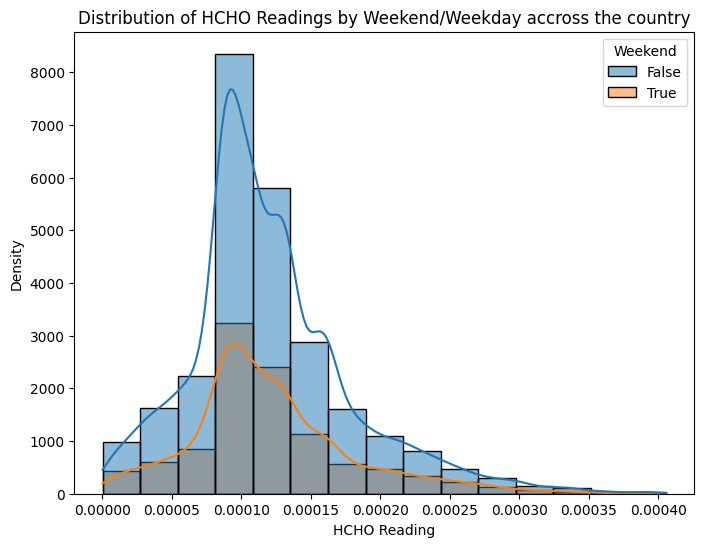

In [267]:
plt.figure(figsize=(8, 6))
sns.histplot(data=melted__day_df, x='HCHO Reading', bins=15, stat='density', kde=True,hue='Weekend')
plt.title("Distribution of HCHO Readings by Weekend/Weekday accross the country")
plt.xlabel("HCHO Reading")
plt.ylabel("Density")


Text(0, 0.5, 'HCHO Reading')

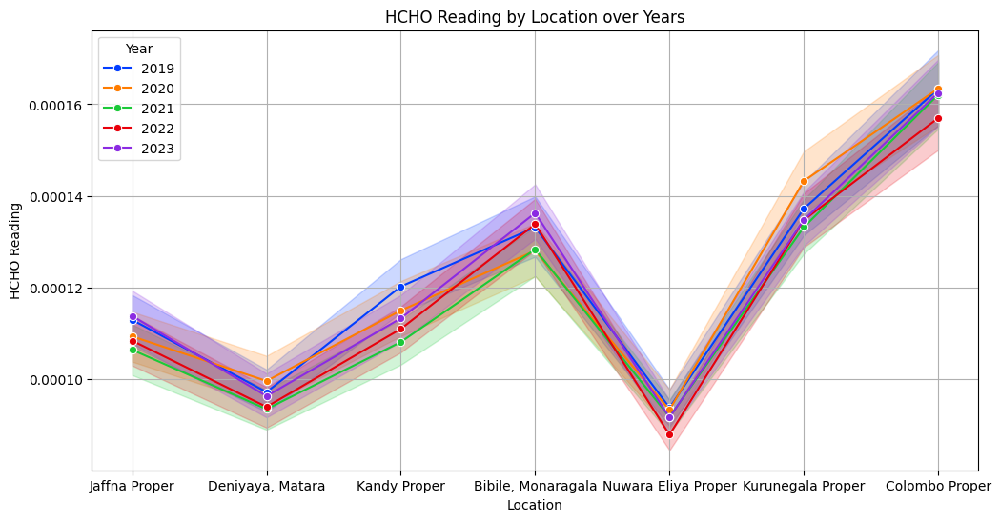

In [132]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=melted_df,x="Location", y='HCHO Reading',hue='Year',palette="bright",marker='o')
plt.title("HCHO Reading by Location over Years")
plt.xlabel("Location")
plt.grid(True)
plt.ylabel("HCHO Reading")

In [107]:
melted_df = pd.melt(df, id_vars=['Year'], value_vars=['Jaffna Proper', 'Deniyaya, Matara', 'Kandy Proper', 
                                                     'Bibile, Monaragala', 'Nuwara Eliya Proper', 
                                                     'Kurunegala Proper', 'Colombo Proper'], 
                     var_name='Location', value_name='HCHO Reading')

<h2>Spatio temporal analysis</h2>

air pollution per city

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df=pd.read_csv("uncleaned data/air_pollution_openWeatherapi.csv")
df.head()

,Date-time,City,co,no,no2,o3,so2,pm2_5,pm10,nh3,aqi
0,2020-11-25 01:00:00,Colombo,353.81,0.00,3.04,97.28,3.43,20.58,21.55,0.00,3
1,2020-11-25 02:00:00,Colombo,363.83,0.01,5.14,92.98,4.47,18.83,20.07,0.00,2
2,2020-11-25 03:00:00,Colombo,370.50,0.01,7.80,89.41,5.96,16.18,17.67,0.01,2
3,2020-11-25 04:00:00,Colombo,370.50,0.03,9.60,87.26,7.27,13.55,15.37,0.12,2
4,2020-11-25 05:00:00,Colombo,360.49,0.07,9.25,88.69,6.50,11.99,14.20,0.17,2


In [4]:
df.columns

Index(['Date-time', 'City', 'co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10',
       'nh3', 'aqi'],
      dtype='object')

get elevation data

In [6]:
import requests

def get_lat_lon(api_key,city_name,limit=1):
    BASE_URL = "http://api.openweathermap.org/geo/1.0/direct"
    url = f"{BASE_URL}?q={city_name}&limit={limit}&appid={api_key}"
    response = requests.get(url).json()
    lat=response[0]['lat']
    lon=response[0]['lon']
    return lat,lon

In [24]:
import requests

def get_altitude(lat, lon):
    BASE_URL = "https://api.open-meteo.com/v1/elevation"
    url = f"{BASE_URL}?latitude={lat}&longitude={lon}"
    response = requests.get(url)
    print("Scraped Altitude")
    return response.json()

api_key = "a1cffafa176a92a84c228d49cef0a38b"
cities = ["Colombo","Matara","Nuwara Eliya","Monaragala","Kurunegala","Jaffna","Kandy"]

data=[]
for city_name in cities:
    lat,lon = get_lat_lon(api_key, city_name,limit=1)
    response_alt = get_altitude(lat, lon)    
    row=[city_name,response_alt["elevation"][0]]
    data.append(row)
    print(f"Scraped {city_name} data")

import pandas as pd
col=['City','Altitude (metres)']
alt=pd.DataFrame(data,columns=col)
alt.to_csv('altitude.csv',index=False)


Scraped Altitude
Scraped Colombo data
Scraped Altitude
Scraped Matara data
Scraped Altitude
Scraped Nuwara Eliya data
Scraped Altitude
Scraped Monaragala data
Scraped Altitude
Scraped Kurunegala data
Scraped Altitude
Scraped Jaffna data
Scraped Altitude
Scraped Kandy data


webscraping Flood data

In [17]:
!pip install openmeteo-requests
!pip install requests-cache retry-requests numpy pandas

  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 23.5.26
    Uninstalling flatbuffers-23.5.26:
      Successfully uninstalled flatbuffers-23.5.26
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.4/61.4 kB 1.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 2.9 MB/s eta 0:00:00
  Attempting uninstall: attrs
    Found existing installation: attrs 22.2.0
    Uninstalling attrs-22.2.0:
      Successfully uninstalled attrs-22.2.0


In [23]:
import openmeteo_requests

import requests_cache
import pandas as pd
from retry_requests import retry

# Setup the Open-Meteo API client with cache and retry on error
cache_session = requests_cache.CachedSession('.cache', expire_after = 3600)
retry_session = retry(cache_session, retries = 5, backoff_factor = 0.2)
openmeteo = openmeteo_requests.Client(session = retry_session)

# Make sure all required weather variables are listed here
# The order of variables in hourly or daily is important to assign them correctly below
url = "https://flood-api.open-meteo.com/v1/flood"
params = {
	"latitude": 6.9355,
	"longitude": 79.8487,
	"daily": ["river_discharge", "river_discharge_mean"],
	"start_date": "2019-01-01",
	"end_date": "2023-12-31"
}
responses = openmeteo.weather_api(url, params=params)

# Process first location. Add a for-loop for multiple locations or weather models
response = responses[0]
print(f"Coordinates {response.Latitude()}°N {response.Longitude()}°E")
print(f"Elevation {response.Elevation()} m asl")
print(f"Timezone {response.Timezone()} {response.TimezoneAbbreviation()}")
print(f"Timezone difference to GMT+0 {response.UtcOffsetSeconds()} s")

# Process daily data. The order of variables needs to be the same as requested.
daily = response.Daily()
daily_river_discharge = daily.Variables(0).ValuesAsNumpy()
daily_river_discharge_mean = daily.Variables(1).ValuesAsNumpy()

daily_data = {"date": pd.date_range(
	start = pd.to_datetime(daily.Time(), unit = "s", utc = True),
	end = pd.to_datetime(daily.TimeEnd(), unit = "s", utc = True),
	freq = pd.Timedelta(seconds = daily.Interval()),
	inclusive = "left"
)}
daily_data["City"] = city_name
daily_data["river_discharge"] = daily_river_discharge

daily_dataframe = pd.DataFrame(data = daily_data)
print(daily_dataframe)

Coordinates 6.950004577636719°N 79.85000610351562°E
Elevation nan m asl
Timezone None None
Timezone difference to GMT+0 0 s
                          date   City  river_discharge
0    2019-01-01 00:00:00+00:00  Kandy       104.196205
1    2019-01-02 00:00:00+00:00  Kandy        98.769997
2    2019-01-03 00:00:00+00:00  Kandy        93.841843
3    2019-01-04 00:00:00+00:00  Kandy        89.364944
4    2019-01-05 00:00:00+00:00  Kandy        84.703781
...                        ...    ...              ...
1821 2023-12-27 00:00:00+00:00  Kandy       321.849457
1822 2023-12-28 00:00:00+00:00  Kandy       303.088531
1823 2023-12-29 00:00:00+00:00  Kandy       298.226501
1824 2023-12-30 00:00:00+00:00  Kandy       292.764923
1825 2023-12-31 00:00:00+00:00  Kandy       313.050842

[1826 rows x 3 columns]


In [35]:
import requests
import pandas as pd
import openmeteo_requests
from retry_requests import retry
import requests_cache

# Function to get latitude and longitude for a city
def get_lat_lon(api_key, city_name, limit=1):
    BASE_URL = "http://api.openweathermap.org/geo/1.0/direct"
    url = f"{BASE_URL}?q={city_name}&limit={limit}&appid={api_key}"
    response = requests.get(url).json()
    lat = response[0]['lat']
    lon = response[0]['lon']
    return lat, lon

# Function to get altitude for a given latitude and longitude


# Setup the Open-Meteo API client with cache and retry on error
cache_session = requests_cache.CachedSession('.cache', expire_after=3600)
retry_session = retry(cache_session, retries=5, backoff_factor=0.2)
openmeteo = openmeteo_requests.Client(session=retry_session)

# List of cities
cities = ["Colombo", "Matara", "Nuwara Eliya", "Monaragala", "Kurunegala", "Jaffna", "Kandy"]

# Fetching flood data for each city
flood_data = []
for city_name in cities:
    url = "https://flood-api.open-meteo.com/v1/flood"
    lat, lon = get_lat_lon(api_key, city_name, limit=1)
    params = {
        "latitude": lat,
        "longitude": lon,
        "daily": ["river_discharge"],
        "start_date": "2019-01-01",
        "end_date": "2023-12-31"
    }
    responses = openmeteo.weather_api(url, params=params)
    response = responses[0]  # Assuming only one response for simplicity
    daily = response.Daily()
    daily_river_discharge = daily.Variables(0).ValuesAsNumpy()
    daily_data = {"date": pd.date_range(
        start=pd.to_datetime(daily.Time(), unit="s", utc=True),
        end=pd.to_datetime(daily.TimeEnd(), unit="s", utc=True),
        freq=pd.Timedelta(seconds=daily.Interval()),
        inclusive="left"
    )}
    daily_data["date"] = daily_data["date"].strftime('%Y-%m-%d')
    daily_data["City"] = city_name
    daily_data["river_discharge"] = daily_river_discharge
    flood_data.append(pd.DataFrame(data=daily_data))

# Concatenate all dataframes into one
flood_dataframe = pd.concat(flood_data)

# Saving the data to CSV
flood_dataframe.to_csv('flood_data.csv', index=False)


Loading sea data

In [68]:
import openmeteo_requests
import requests_cache
import pandas as pd
from retry_requests import retry

# Setup the Open-Meteo API client with cache and retry on error
cache_session = requests_cache.CachedSession('.cache', expire_after=3600)
retry_session = retry(cache_session, retries=5, backoff_factor=0.2)
openmeteo = openmeteo_requests.Client(session=retry_session)

# List of cities
cities = ["Colombo", "Matara", "Nuwara Eliya", "Monaragala", "Kurunegala", "Jaffna", "Kandy"]

# Fetching climate data for each city
climate_data = []
for city_name in cities:
    url = "https://climate-api.open-meteo.com/v1/climate"
    params = {
        "latitude": 52.52,  # Update with the latitude of the city
        "longitude": 13.41,  # Update with the longitude of the city
        "start_date": "2019-01-01",
        "end_date": "2023-12-31",
        "models": ["CMCC_CM2_VHR4", "FGOALS_f3_H", "HiRAM_SIT_HR", "MRI_AGCM3_2_S", "EC_Earth3P_HR", "MPI_ESM1_2_XR", "NICAM16_8S"],
        "daily": ["wind_speed_10m_mean", "cloud_cover_mean", "shortwave_radiation_sum", "relative_humidity_2m_mean", "dew_point_2m_mean", "precipitation_sum", "snowfall_sum", "pressure_msl_mean", "soil_moisture_0_to_10cm_mean", "et0_fao_evapotranspiration_sum"]
    }
    responses = openmeteo.weather_api(url, params=params)
    response = responses[0]  # Assuming only one response for simplicity
    daily = response.Daily()
    
    # Extracting data for each variable
    daily_data = {
        "date": pd.date_range(
            start=pd.to_datetime(daily.Time(), unit="s", utc=True),
            end=pd.to_datetime(daily.TimeEnd(), unit="s", utc=True),
            freq=pd.Timedelta(seconds=daily.Interval()),
            inclusive="left"
        ).strftime('%Y-%m-%d'),  # Convert to string format YYYY-MM-DD
        "City": city_name,
        "wind_speed_10m_mean": daily.Variables(0).ValuesAsNumpy(),
        "cloud_cover_mean": daily.Variables(1).ValuesAsNumpy(),
        "shortwave_radiation_sum": daily.Variables(2).ValuesAsNumpy(),
        "relative_humidity_2m_mean": daily.Variables(3).ValuesAsNumpy(),
        "dew_point_2m_mean": daily.Variables(4).ValuesAsNumpy(),
        "precipitation_sum": daily.Variables(5).ValuesAsNumpy(),
        "snowfall_sum": daily.Variables(6).ValuesAsNumpy(),
        "pressure_msl_mean": daily.Variables(7).ValuesAsNumpy(),
        "soil_moisture_0_to_10cm_mean": daily.Variables(8).ValuesAsNumpy(),
        "et0_fao_evapotranspiration_sum": daily.Variables(9).ValuesAsNumpy()
    }
    
    climate_data.append(pd.DataFrame(data=daily_data))

# Concatenate all dataframes into one
climate_dataframe = pd.concat(climate_data)

# Saving the data to CSV
climate_dataframe.to_csv('climate_data.csv', index=False)


In [77]:
climate_data.to_csv('climate_data.csv', index=False)
climate_data

,date,City,wind_speed_10m_mean,relative_humidity_2m_mean,dew_point_2m_mean,precipitation_sum,pressure_msl_mean,et0_fao_evapotranspiration_sum
0,2019-01-01,Colombo,20.197609,72.689980,0.605066,4.015086,1005.82556,0.388300
1,2019-01-02,Colombo,13.262461,76.647570,-0.426610,2.038777,1003.71826,0.347156
2,2019-01-03,Colombo,5.476305,71.597980,-1.816025,0.741792,1005.78120,0.411232
3,2019-01-04,Colombo,13.830659,67.548390,-0.371967,5.752145,1001.64410,0.489362
4,2019-01-05,Colombo,21.315762,79.498795,0.080531,1.361496,1012.20710,0.302779
...,...,...,...,...,...,...,...,...
12777,2023-12-27,Kandy,13.427204,84.799590,5.530135,2.049242,994.39496,0.438704
12778,2023-12-28,Kandy,20.969793,90.778700,4.755398,2.171240,985.27700,0.398308
12779,2023-12-29,Kandy,17.726767,96.757830,2.491835,1.549321,986.15894,0.217457
12780,2023-12-30,Kandy,17.687714,94.736946,1.513869,3.405071,992.94104,0.302169


In [78]:
climate_data.rename(columns={"date": "Date"}, inplace=True)
climate_data.rename(columns={"wind_speed_10m_mean": "Wind Speed"}, inplace=True)
climate_data.rename(columns={"relative_humidity_2m_mean": "Relative Humidity"}, inplace=True)
climate_data.rename(columns={"dew_point_2m_mean": "Dewpoint"}, inplace=True)
climate_data.rename(columns={"precipitation_sum": "Precipitation"}, inplace=True)
climate_data.rename(columns={"pressure_msl_mean": "Sea level pressure"}, inplace=True)
climate_data.rename(columns={"et0_fao_evapotranspiration_sum": "Evapotranspiration"}, inplace=True)


In [80]:
climate_data.to_csv('climate_data.csv', index=False)

In [91]:
data = {
    "City": ["Colombo", "Gampaha", "Kurunegala", "Kandy", "Kalutara", "Ratnapura", "Galle", "Anuradhapura", "Kegalle", "Badulla", "Matara", "Puttalam", "Nuwara-Eliya", "Ampara", "Hambantota", "Jaffna", "Batticaloa", "Matale", "Moneragala"],
    "Population_2019": [2448, 2417, 1719, 1476, 1284, 1171, 1130, 937, 887, 880, 863, 832, 768, 728, 661, 617, 575, 522, 496],
    "Population_Density_2019": [3621, 1802, 372, 770, 815, 362, 699, 141, 526, 311, 680, 289, 450, 172, 265, 664, 220, 267, 90],
    "Population_2018": [2439, 2409, 1711, 1468, 1281, 1163, 1124, 930, 884, 873, 858, 825, 763, 719, 655, 613, 570, 519, 491],
    "Population_Density_2018": [3608, 1796, 370, 766, 813, 359, 695, 140, 525, 309, 676, 286, 447, 170, 262, 660, 218, 266, 89]
}

# Create DataFrame
df = pd.DataFrame(data)

# Filter data for the specified cities and select columns for the year 2019
specified_cities = ["Colombo", "Matara", "Nuwara-Eliya", "Moneragala", "Kurunegala", "Jaffna", "Kandy"]
filtered_data = df[df['City'].isin(specified_cities)][['City', 'Population_2019', 'Population_Density_2019']]
altitude_data=pd.read_csv("uncleaned data/altitude.csv")
filtered_data = filtered_data.merge(altitude_data, on="City", how="left")
filtered_data["Altitude (metres)"][4]=1884.0
filtered_data["Altitude (metres)"][6]=151.0
filtered_data.to_csv("statistics.csv", index=False)


/var/folders/s3/k3nh4t5j0pl3086gd494qhgh0000gn/T/ipykernel_6612/793731050.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data["Altitude (metres)"][4]=1884.0
/var/folders/s3/k3nh4t5j0pl3086gd494qhgh0000gn/T/ipykernel_6612/793731050.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data["Altitude (metres)"][6]=151.0


COVID 19 analysis

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
covid_data=pd.read_csv("uncleaned data/covid_data.csv")

In [42]:
covid_data.columns

Index(['date', 'total_cases', 'new_cases', 'new_cases_smoothed',
       'total_deaths', 'new_deaths', 'new_deaths_smoothed',
       'total_cases_per_million', 'new_cases_per_million',
       'new_cases_smoothed_per_million', 'total_deaths_per_million',
       'new_deaths_per_million', 'new_deaths_smoothed_per_million',
       'reproduction_rate', 'icu_patients', 'icu_patients_per_million',
       'hosp_patients', 'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       'total_vaccinations_per_hundred', 'people_vacc

In [43]:
covid_data.drop(["excess_mortality_cumulative_per_million", "excess_mortality_cumulative", "excess_mortality", "excess_mortality_cumulative_absolute", "handwashing_facilities"], axis=1, errors='ignore',inplace=True)


In [44]:
covid_data[covid_data["date"]=="2020-03-20"]
covid_data["Lockdown"]=""
for index, row in covid_data.iterrows():
    if row["date"] >= "2020-03-20" and row["date"] <= "2020-05-20":
        covid_data.at[index, "Lockdown"] = "Yes"
    else:
        covid_data.at[index, "Lockdown"] = "No"


In [45]:
covid_data.drop(["population","life_expectancy","human_development_index","new_cases_smoothed_per_million","new_cases_per_million","new_deaths_smoothed","new_deaths"], axis=1, errors='ignore',inplace=True)

In [46]:
covid_data=covid_data[['date','total_cases', 'new_cases',
       'total_deaths','Lockdown']]

In [47]:
covid_data[covid_data["date"]>="2020-03-20"]

,date,total_cases,new_cases,total_deaths,Lockdown
75,2020-03-20,11.0,0.0,NaN,Yes
76,2020-03-21,11.0,0.0,NaN,Yes
77,2020-03-22,82.0,71.0,NaN,Yes
78,2020-03-23,82.0,0.0,NaN,Yes
79,2020-03-24,82.0,0.0,NaN,Yes
...,...,...,...,...,...
1515,2024-02-28,672749.0,0.0,16897.0,No
1516,2024-02-29,672749.0,0.0,16897.0,No
1517,2024-03-01,672749.0,0.0,16897.0,No
1518,2024-03-02,672749.0,0.0,16897.0,No


<AxesSubplot: xlabel='date'>

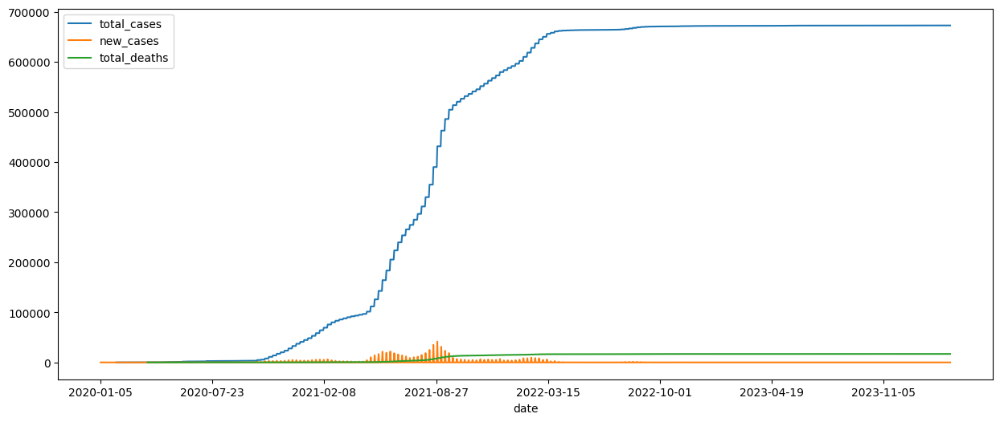

In [48]:
covid_data.plot(x="date", y=["total_cases", "new_cases", "total_deaths"], kind="line", figsize=(15, 6))

In [50]:
covid_data.to_csv("covid_data.csv", index=False)

Data collection completed, need to peform analysis

cleaning new data

In [5]:
import pandas as pd
df = pd.read_csv("uncleaned data/air_pollution_openWeatherapi.csv")
df.columns=["Date Time","City",
    "Carbon Monoxide (CO)",
    "Nitric Oxide (NO)",
    "Nitrogen Dioxide (NO2)",
    "Ozone (O3)",
    "Sulfur Dioxide (SO2)",
    "Ammonia (NH3)",
    "Particulate Matter 2.5 micrometers or less in diameter (PM2.5)",
    "Particulate Matter 10 micrometers or less in diameter (PM10)","Air quality Index"
]

In [6]:
df

,Date Time,City,Carbon Monoxide (CO),Nitric Oxide (NO),Nitrogen Dioxide (NO2),Ozone (O3),Sulfur Dioxide (SO2),Ammonia (NH3),Particulate Matter 2.5 micrometers or less in diameter (PM2.5),Particulate Matter 10 micrometers or less in diameter (PM10),Air quality Index
0,2020-11-25 01:00:00,Colombo,353.81,0.00,3.04,97.28,3.43,20.58,21.55,0.00,3
1,2020-11-25 02:00:00,Colombo,363.83,0.01,5.14,92.98,4.47,18.83,20.07,0.00,2
2,2020-11-25 03:00:00,Colombo,370.50,0.01,7.80,89.41,5.96,16.18,17.67,0.01,2
3,2020-11-25 04:00:00,Colombo,370.50,0.03,9.60,87.26,7.27,13.55,15.37,0.12,2
4,2020-11-25 05:00:00,Colombo,360.49,0.07,9.25,88.69,6.50,11.99,14.20,0.17,2
...,...,...,...,...,...,...,...,...,...,...,...
187777,2023-12-31 14:00:00,Kandy,320.43,0.00,1.78,31.11,0.69,2.35,3.98,1.17,1
187778,2023-12-31 15:00:00,Kandy,320.43,0.00,1.78,30.40,0.77,2.76,4.72,1.25,1
187779,2023-12-31 16:00:00,Kandy,320.43,0.00,1.63,30.04,0.75,2.82,4.86,1.25,1
187780,2023-12-31 17:00:00,Kandy,317.10,0.00,1.56,30.04,0.72,2.62,4.60,1.22,1


In [7]:
df.to_csv("air_pollution.csv", index=False)

In [28]:
df = pd.read_csv("uncleaned data/covid_data.csv")
df["total_cases"].fillna(0, inplace=True)
df["new_cases"].fillna(0, inplace=True)
df["total_deaths"].fillna(0, inplace=True)
df.to_csv("covid_data.csv", index=False)

In [30]:
df = pd.read_csv("uncleaned data/flood_data.csv")
df.isna().sum()

date               0
City               0
river_discharge    0
dtype: int64

In [21]:
import pandas as pd
df=pd.read_csv("data/uncleaned data/Global_Summary_Year.csv")
df.columns

Index(['STATION', 'NAME', 'LATITUDE', 'LONGITUDE', 'ELEVATION', 'DATE', 'CDSD',
       'CDSD_ATTRIBUTES', 'CLDD', 'CLDD_ATTRIBUTES', 'DP01', 'DP01_ATTRIBUTES',
       'DP10', 'DP10_ATTRIBUTES', 'DT00', 'DT00_ATTRIBUTES', 'DT32',
       'DT32_ATTRIBUTES', 'DX32', 'DX32_ATTRIBUTES', 'DX70', 'DX70_ATTRIBUTES',
       'DX90', 'DX90_ATTRIBUTES', 'EMNT', 'EMNT_ATTRIBUTES', 'EMXP',
       'EMXP_ATTRIBUTES', 'EMXT', 'EMXT_ATTRIBUTES', 'HDSD', 'HDSD_ATTRIBUTES',
       'HTDD', 'HTDD_ATTRIBUTES', 'PRCP', 'PRCP_ATTRIBUTES', 'TAVG',
       'TAVG_ATTRIBUTES', 'TMAX', 'TMAX_ATTRIBUTES', 'TMIN',
       'TMIN_ATTRIBUTES'],
      dtype='object')

In [22]:
df

,STATION,NAME,LATITUDE,LONGITUDE,ELEVATION,DATE,CDSD,CDSD_ATTRIBUTES,CLDD,CLDD_ATTRIBUTES,...,HTDD,HTDD_ATTRIBUTES,PRCP,PRCP_ATTRIBUTES,TAVG,TAVG_ATTRIBUTES,TMAX,TMAX_ATTRIBUTES,TMIN,TMIN_ATTRIBUTES
0,CEM00043441,"KURUNEGALA, CE",7.467,80.367,116.0,2020,NaN,NaN,NaN,NaN,...,NaN,NaN,74.57,",S",NaN,NaN,NaN,NaN,NaN,NaN
1,CEM00043441,"KURUNEGALA, CE",7.467,80.367,116.0,2021,NaN,NaN,NaN,NaN,...,NaN,NaN,98.27,",S",NaN,NaN,NaN,NaN,NaN,NaN
2,CEM00043441,"KURUNEGALA, CE",7.467,80.367,116.0,2023,NaN,NaN,NaN,NaN,...,NaN,NaN,92.29,",S",NaN,NaN,90.2,S,NaN,NaN
3,CEM00043466,"COLOMBO, CE",6.900,79.867,7.0,2019,NaN,NaN,NaN,NaN,...,NaN,NaN,107.04,",S",NaN,NaN,NaN,NaN,NaN,NaN
4,CEM00043466,"COLOMBO, CE",6.900,79.867,7.0,2020,NaN,NaN,NaN,NaN,...,NaN,NaN,81.54,",S",NaN,NaN,NaN,NaN,NaN,NaN
5,CEM00043466,"COLOMBO, CE",6.900,79.867,7.0,2021,NaN,NaN,NaN,NaN,...,NaN,NaN,113.35,",S",NaN,NaN,NaN,NaN,NaN,NaN
6,CEM00043466,"COLOMBO, CE",6.900,79.867,7.0,2023,NaN,NaN,NaN,NaN,...,NaN,NaN,128.10,",S",NaN,NaN,88.3,S,NaN,NaN
7,CE000434730,"NUWARA ELIYA, CE",6.967,80.767,1880.0,2020,NaN,NaN,NaN,NaN,...,NaN,NaN,61.20,",S",NaN,NaN,NaN,NaN,NaN,NaN
8,CE000434730,"NUWARA ELIYA, CE",6.967,80.767,1880.0,2021,NaN,NaN,NaN,NaN,...,NaN,NaN,75.91,",S",NaN,NaN,NaN,NaN,NaN,NaN
9,CE000434730,"NUWARA ELIYA, CE",6.967,80.767,1880.0,2023,NaN,NaN,NaN,NaN,...,NaN,NaN,87.98,",S",NaN,NaN,69.2,S,NaN,NaN


In [23]:
df.columns

Index(['STATION', 'NAME', 'LATITUDE', 'LONGITUDE', 'ELEVATION', 'DATE', 'CDSD',
       'CDSD_ATTRIBUTES', 'CLDD', 'CLDD_ATTRIBUTES', 'DP01', 'DP01_ATTRIBUTES',
       'DP10', 'DP10_ATTRIBUTES', 'DT00', 'DT00_ATTRIBUTES', 'DT32',
       'DT32_ATTRIBUTES', 'DX32', 'DX32_ATTRIBUTES', 'DX70', 'DX70_ATTRIBUTES',
       'DX90', 'DX90_ATTRIBUTES', 'EMNT', 'EMNT_ATTRIBUTES', 'EMXP',
       'EMXP_ATTRIBUTES', 'EMXT', 'EMXT_ATTRIBUTES', 'HDSD', 'HDSD_ATTRIBUTES',
       'HTDD', 'HTDD_ATTRIBUTES', 'PRCP', 'PRCP_ATTRIBUTES', 'TAVG',
       'TAVG_ATTRIBUTES', 'TMAX', 'TMAX_ATTRIBUTES', 'TMIN',
       'TMIN_ATTRIBUTES'],
      dtype='object')

In [24]:
df.drop(["STATION", 'LATITUDE', 'LONGITUDE', 'ELEVATION', 'CDSD', 'CDSD_ATTRIBUTES', 'CLDD', 'CLDD_ATTRIBUTES', 'DP01', 'DP01_ATTRIBUTES', 'DP10', 'DP10_ATTRIBUTES', 'DT00', 'DT00_ATTRIBUTES', 'DT32', 'DT32_ATTRIBUTES', 'DX32', 'DX32_ATTRIBUTES', 'DX70', 'DX70_ATTRIBUTES', 'DX90', 'DX90_ATTRIBUTES', 'EMNT', 'EMNT_ATTRIBUTES', 'EMXP', 'EMXP_ATTRIBUTES', 'EMXT', 'EMXT_ATTRIBUTES', 'HDSD', 'HDSD_ATTRIBUTES', 'HTDD', 'HTDD_ATTRIBUTES','PRCP_ATTRIBUTES', 'TAVG','TAVG_ATTRIBUTES', 'TMAX', 'TMAX_ATTRIBUTES', 'TMIN','TMIN_ATTRIBUTES'],axis=1,inplace=True)



In [46]:
df.to_csv("Precipitation summary of the year")

Index(['NAME', 'DATE', 'PRCP'], dtype='object')

In [56]:
data=pd.read_csv(r"data\uncleaned data\Precipitation_and_Temperature.csv")
data.drop("STATION",axis=1,inplace=True)

data.to_csv("Precipitation and temp of 3 cities.csv")

Data visuialisation

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

Colombo

In [53]:
hcho_data = pd.read_csv("data\cleaned data\preprocessed_HCHO_data\Colombo Proper_hcho.csv")
climate_data= pd.read_csv("data\cleaned data\climate_data.csv")

climate_data

,Date,City,Wind Speed,Relative Humidity,Dewpoint,Precipitation,Sea level pressure,Evapotranspiration
0,2019-01-01,Colombo,20.197609,72.689980,0.605066,4.015086,1005.82556,0.388300
1,2019-01-02,Colombo,13.262461,76.647570,-0.426610,2.038777,1003.71826,0.347156
2,2019-01-03,Colombo,5.476305,71.597980,-1.816025,0.741792,1005.78120,0.411232
3,2019-01-04,Colombo,13.830659,67.548390,-0.371967,5.752145,1001.64410,0.489362
4,2019-01-05,Colombo,21.315762,79.498795,0.080531,1.361496,1012.20710,0.302779
...,...,...,...,...,...,...,...,...
12777,2023-12-27,Kandy,13.427204,84.799590,5.530135,2.049242,994.39496,0.438704
12778,2023-12-28,Kandy,20.969793,90.778700,4.755398,2.171240,985.27700,0.398308
12779,2023-12-29,Kandy,17.726767,96.757830,2.491835,1.549321,986.15894,0.217457
12780,2023-12-30,Kandy,17.687714,94.736946,1.513869,3.405071,992.94104,0.302169


In [54]:
hcho_data["Current Date"] = pd.to_datetime(hcho_data["Current Date"])
colombo_climate=climate_data[climate_data["City"] == "Colombo"]
colombo_climate["Date"] = pd.to_datetime(colombo_climate["Date"])
colombo_data = pd.merge(hcho_data, colombo_climate, left_on="Current Date", right_on="Date", how="inner")

colombo_data.drop(["City","Location","Next Date","Current Date"],axis=1,inplace=True)
colombo_data

C:\Users\Hammaad\AppData\Local\Temp/ipykernel_16616/2429622602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  colombo_climate["Date"] = pd.to_datetime(colombo_climate["Date"])


,HCHO Reading,Date,Wind Speed,Relative Humidity,Dewpoint,Precipitation,Sea level pressure,Evapotranspiration
0,0.000263,2019-01-02,13.262461,76.647570,-0.426610,2.038777,1003.71826,0.347156
1,0.000099,2019-01-03,5.476305,71.597980,-1.816025,0.741792,1005.78120,0.411232
2,0.000210,2019-01-04,13.830659,67.548390,-0.371967,5.752145,1001.64410,0.489362
3,0.000179,2019-01-05,21.315762,79.498795,0.080531,1.361496,1012.20710,0.302779
4,0.000108,2019-01-06,13.534254,84.449220,1.289389,4.582193,1000.76990,0.317743
...,...,...,...,...,...,...,...,...
1274,0.000182,2023-12-24,22.921675,89.862206,5.344824,4.858445,1016.44885,0.327817
1275,0.000343,2023-12-25,23.456478,96.841330,5.647907,1.306712,1021.23090,0.226686
1276,0.000118,2023-12-27,13.427204,84.799590,5.530135,2.049242,994.39496,0.438704
1277,0.000140,2023-12-30,17.687714,94.736946,1.513869,3.405071,992.94104,0.302169


Climate Data analysis

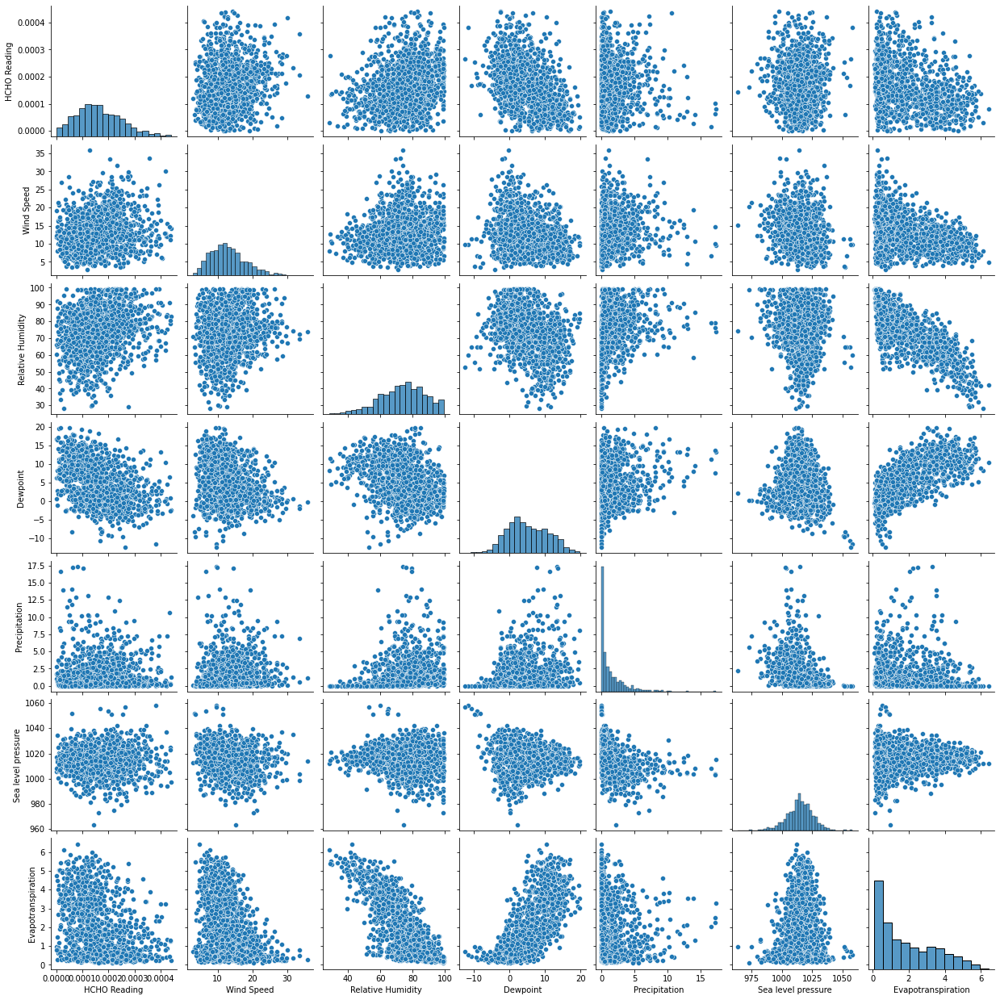

In [55]:
sns.pairplot(colombo_data)

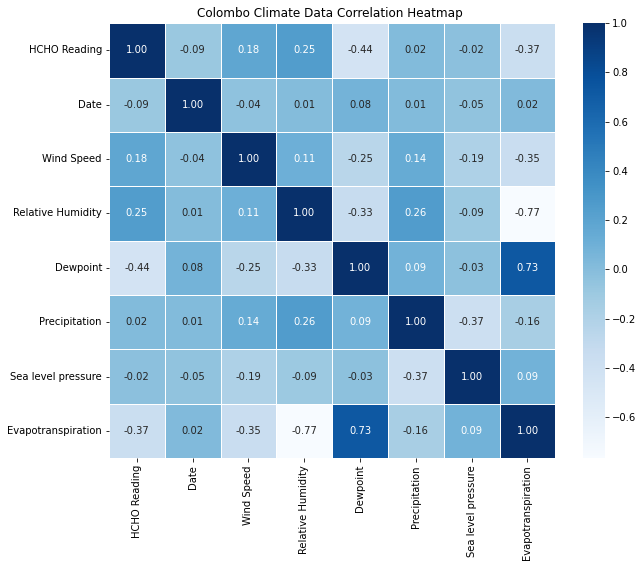

In [56]:
df= colombo_data
correlation_matrix = df.corr()

# Plot correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt=".2f", linewidths=0.5)
plt.title('Colombo Climate Data Correlation Heatmap ')
plt.show()

Windspeed, humidity, and precipitation are coreelating with HCHO reading for colombo, as highlighted with a darker shade of blue compared to the rest

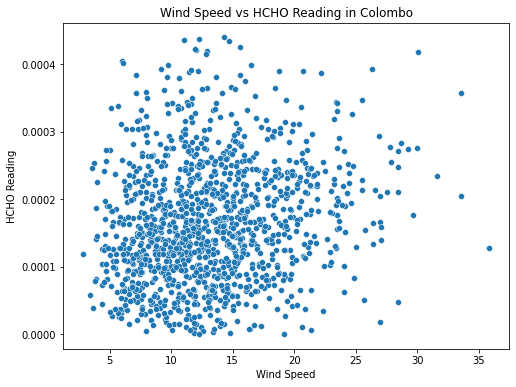

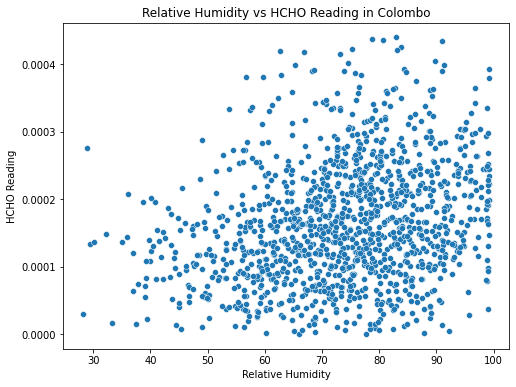

In [57]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Wind Speed', y='HCHO Reading', data=df)
plt.title('Wind Speed vs HCHO Reading in Colombo')
plt.xlabel('Wind Speed')
plt.ylabel('HCHO Reading')
plt.show()

plt.figure(figsize=(8, 6))
sns.scatterplot(x='Relative Humidity', y='HCHO Reading', data=df)
plt.title('Relative Humidity vs HCHO Reading in Colombo')
plt.xlabel('Relative Humidity')
plt.ylabel('HCHO Reading')
plt.show()

Precipation and HCHO anaylsis 

In [58]:
precipitation= pd.read_csv("data/cleaned data/Precipitation and temp of 3 cities.csv")
colombo_precipitation=precipitation[precipitation["NAME"]=="COLOMBO, CE"]
colombo_precipitation["DATE"] = pd.to_datetime(colombo_precipitation["DATE"])


C:\Users\Hammaad\AppData\Local\Temp/ipykernel_16616/138678261.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  colombo_precipitation["DATE"] = pd.to_datetime(colombo_precipitation["DATE"])


In [86]:
colombo_data = pd.merge(hcho_data, colombo_precipitation, left_on="Current Date", right_on="DATE", how="inner")
colombo_data.drop(["Location"	,"Current Date",	"Next Date",	"NAME"],axis=1,inplace=True)

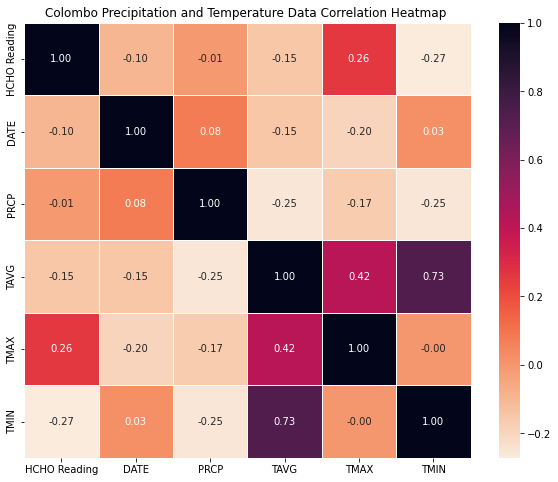

In [87]:
df= colombo_data
correlation_matrix = df.corr()

# Plot correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='rocket_r', fmt=".2f", linewidths=0.5)
plt.title('Colombo Precipitation and Temperature Data Correlation Heatmap ')
plt.show()

Find the realtionship between HCHO data and TMAX

Text(0, 0.5, 'HCHO Reading')

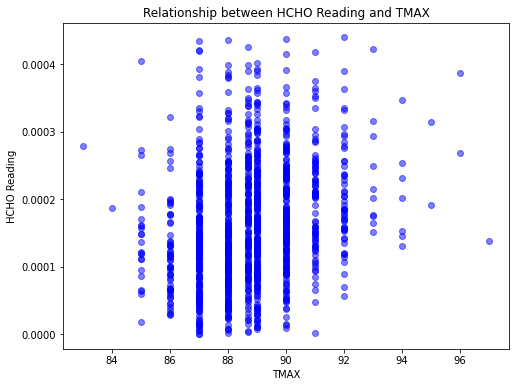

In [116]:
plt.figure(figsize=(8, 6))
plt.scatter(df['TMAX'], df['HCHO Reading'], color='blue', alpha=0.5)
plt.title('Relationship between HCHO Reading and TMAX')
plt.xlabel('TMAX')
plt.ylabel('HCHO Reading')

need to conmsider the sources of increase in TMAX, global warming

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
pollution=pd.read_csv("data/cleaned data/air_pollution.csv")
pollution.head()

,Date Time,City,Carbon Monoxide (CO),Nitric Oxide (NO),Nitrogen Dioxide (NO2),Ozone (O3),Sulfur Dioxide (SO2),Ammonia (NH3),Particulate Matter 2.5 micrometers or less in diameter (PM2.5),Particulate Matter 10 micrometers or less in diameter (PM10),Air quality Index
0,2020-11-25 01:00:00,Colombo,353.81,0.00,3.04,97.28,3.43,20.58,21.55,0.00,3
1,2020-11-25 02:00:00,Colombo,363.83,0.01,5.14,92.98,4.47,18.83,20.07,0.00,2
2,2020-11-25 03:00:00,Colombo,370.50,0.01,7.80,89.41,5.96,16.18,17.67,0.01,2
3,2020-11-25 04:00:00,Colombo,370.50,0.03,9.60,87.26,7.27,13.55,15.37,0.12,2
4,2020-11-25 05:00:00,Colombo,360.49,0.07,9.25,88.69,6.50,11.99,14.20,0.17,2


Finding the trend using seasonal decomposition

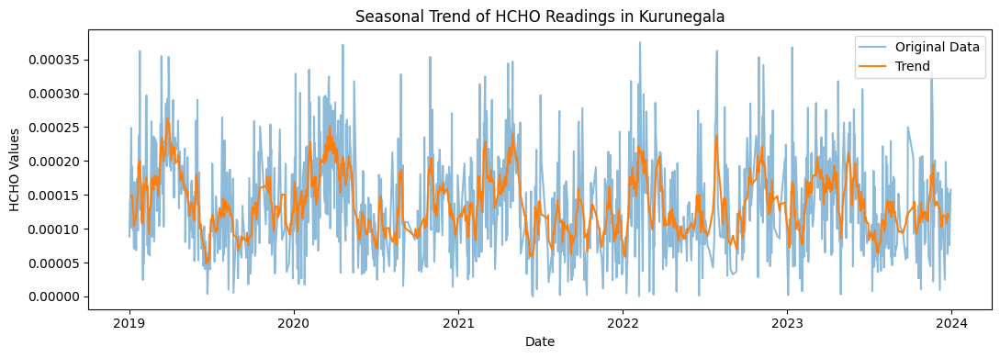

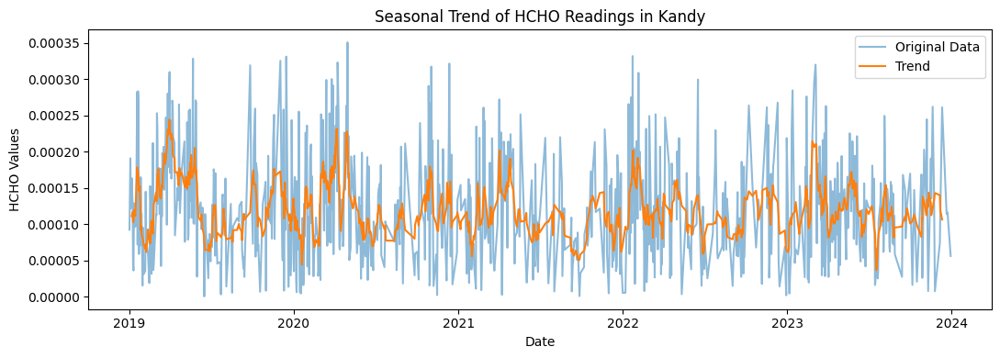

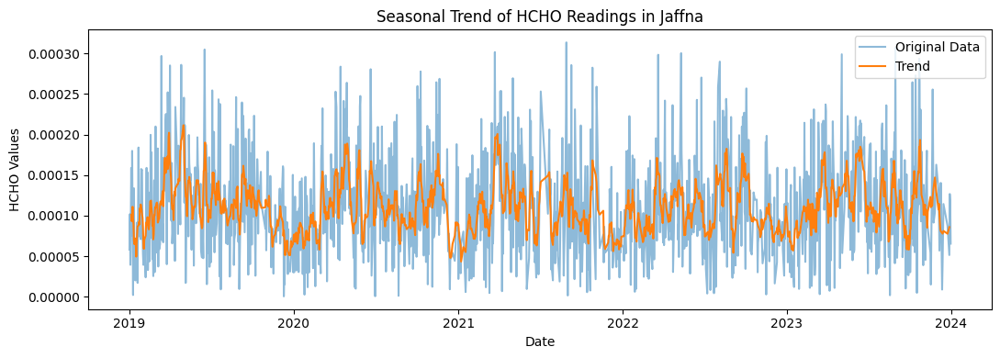

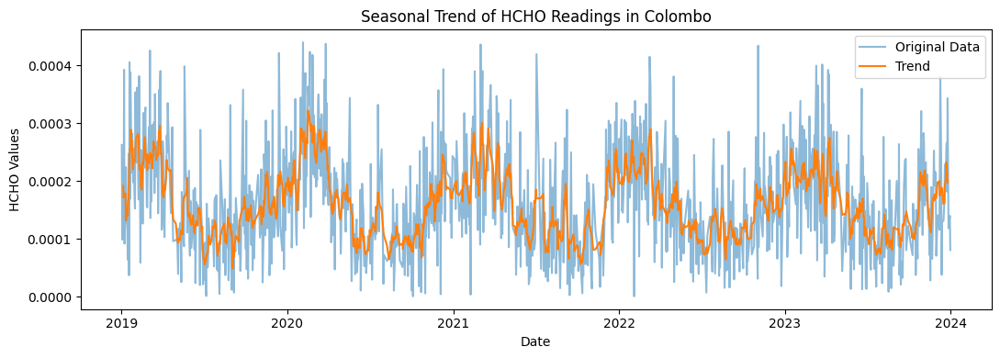

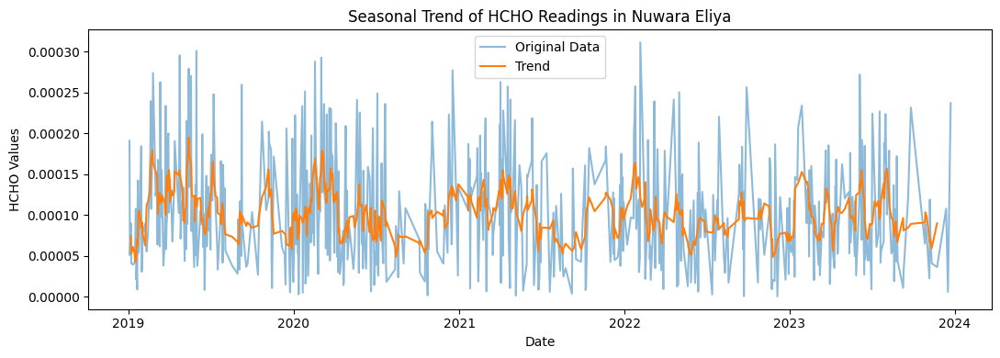

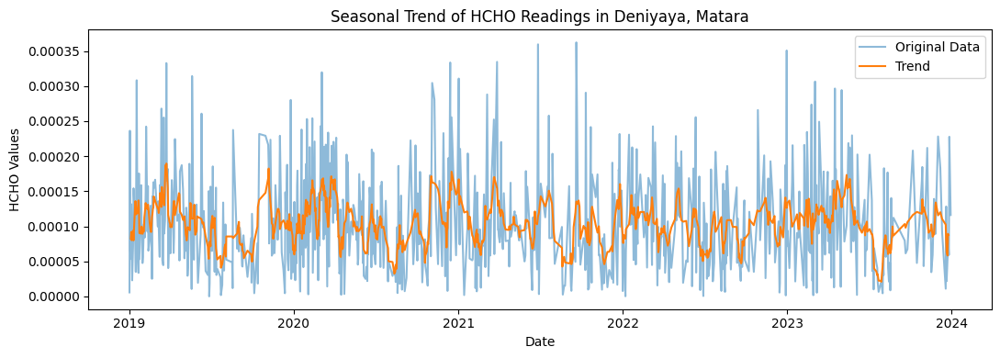

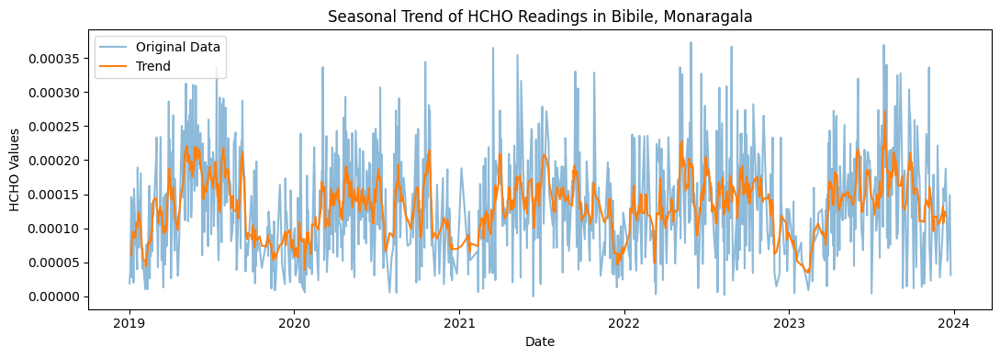

In [27]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import os

directory = "/Users/hammaad/HCHO-Time-Series-Predictor/data/cleaned data/preprocessed_HCHO_data/"

for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        df = pd.read_csv(os.path.join(directory, filename))
        city = filename.split("_hcho")[0]
        cityname=city.split(" Proper")[0]

        df['Current Date'] = pd.to_datetime(df['Current Date'])

        df.set_index('Current Date', inplace=True)
        df.drop(['Location', 'Next Date'], axis=1, inplace=True)

        moving_average = 7 

        decomposition = sm.tsa.seasonal_decompose(df['HCHO Reading'], model='additive', period=moving_average)
        trend = decomposition.trend

        # Plotting
        plt.figure(figsize=(11, 4))
        plt.plot(df.index, df['HCHO Reading'], label='Original Data',alpha=0.5)
        plt.plot(trend, label='Trend')
        plt.title(f'Seasonal Trend of HCHO Readings in {cityname}')
        plt.xlabel('Date')
        plt.ylabel('HCHO Values')
        plt.legend()

        plt.tight_layout()
        plt.show()



COVID 19 impact

In [28]:
import pandas as pd
covid = pd.read_csv("data/cleaned data/covid_data.csv")
covid


,date,total_cases,new_cases,total_deaths,Lockdown
0,2020-01-05,0.0,0.0,0.0,No
1,2020-01-06,0.0,0.0,0.0,No
2,2020-01-07,0.0,0.0,0.0,No
3,2020-01-08,0.0,0.0,0.0,No
4,2020-01-09,0.0,0.0,0.0,No
...,...,...,...,...,...
1515,2024-02-28,672749.0,0.0,16897.0,No
1516,2024-02-29,672749.0,0.0,16897.0,No
1517,2024-03-01,672749.0,0.0,16897.0,No
1518,2024-03-02,672749.0,0.0,16897.0,No


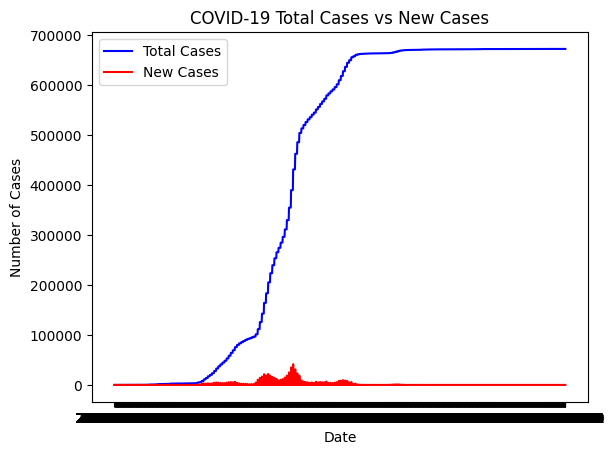

In [34]:
plt.plot(covid['date'], covid['total_cases'], label='Total Cases', color='blue')
plt.plot(covid['date'], covid['new_cases'], label='New Cases', color='red')

plt.xlabel('Date')
plt.ylabel('Number of Cases')
plt.title('COVID-19 Total Cases vs New Cases')
plt.legend()

<AxesSubplot: title={'center': 'New Cases of COVID-19 '}, xlabel='date'>

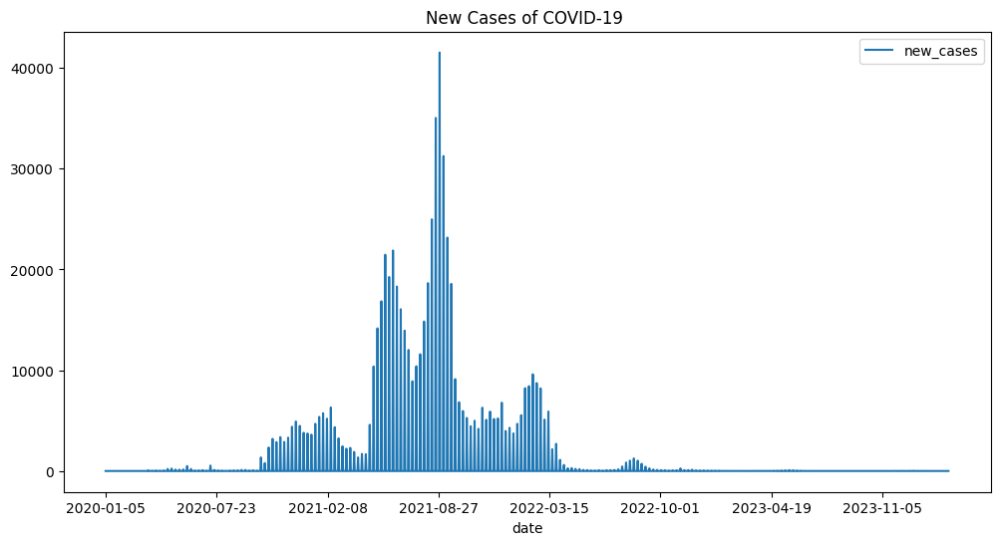

In [38]:

covid.plot(x='date', y='new_cases', kind='line', figsize=(12, 6),title='New Cases of COVID-19 ')

<AxesSubplot: xlabel='Current Date'>

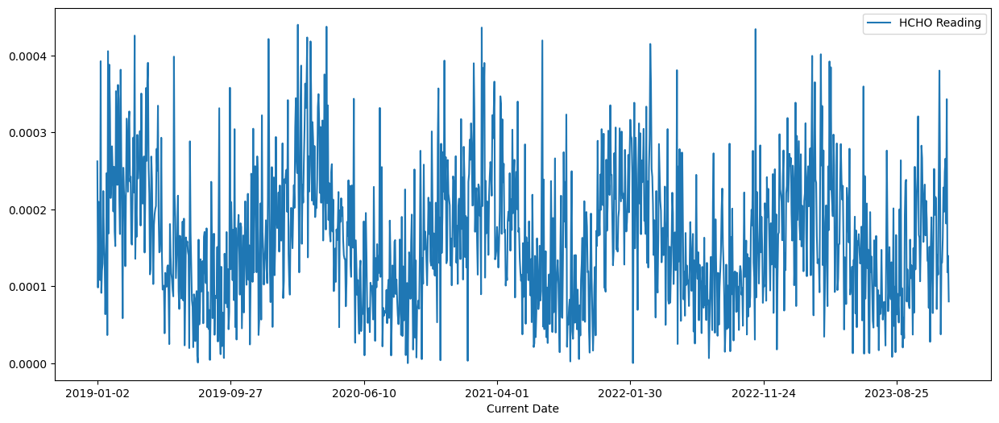

In [30]:
hcho_data=pd.read_csv("data/cleaned data/preprocessed_HCHO_data/Colombo Proper_hcho.csv")
hcho_data.plot(x="Current Date", y=["HCHO Reading"], kind="line", figsize=(15, 6))